# CAPSTONE PROJECT:

Group members:

Monica Mwangi<br>
Diana Mbuvi<br> 
Wachuka Kinyanjui<br>
Lewis Ngunjiri<br>
Shilton Soi<br> 
Caleb Kenyatta 

## 1.0 Introduction
### 1.1 Business Understanding
We aim to address the challenge of job searching by developing a system that simplifies the process of finding relevant job postings. We aim to enhance the job search experience by making it more efficient and tailored to individual qualifications and preferences. Having personally experienced the tedious and time-consuming nature of job searching, we recognise the need for a solution that can streamline this process. By improving the job search experience, we believe we can benefit both job seekers and recruiters. Job seekers will be able to quickly find positions that match their skills and interests, while recruiters will have an easier time identifying suitable candidates for their openings.

This project is relevant across all industries, as job searching is a universal activity that affects professionals in every field. The primary users of the job recommendation system include job seekers looking for new opportunities, professionals seeking career advancement, and recruiters and hiring managers aiming to find the right candidates for their job openings. If implemented, this job recommendation system would significantly ease the job search process for individuals, leading to quicker and more accurate matches between job seekers and available positions. Consequently, recruiters would benefit from a more efficient hiring process, reducing the time and effort required to find qualified candidates.

Our project builds on existing research in the field of job recommendations. For instance, we have explored papers such as "Enhancing Job Recommendations Using NLP and Machine Learning Techniques" by Narula, Rachna, Kumar, Vijay, Arora, Renuka, and Bhatia, Rishu (2023). This research highlights the potential of natural language processing (NLP) and machine learning techniques to improve job recommendation systems. Our primary motivation for this project is to create a solution that addresses a real-world problem and has a positive societal impact. By developing a job recommendation system, we hope to contribute to the betterment of the job search experience for individuals and the recruitment process for organizations.

### 1.2 Problem Statement
The traditional job search process is often cumbersome and inefficient, requiring job seekers to sift through numerous job postings that may not align with their skills and interests. This mismatch leads to frustration among job seekers and inefficiencies for recruiters who struggle to find suitable candidates. The problem is compounded by the volume of data available, which can overwhelm job seekers and recruiters alike. There is a need for a streamlined solution that can intelligently match job seekers with relevant job postings based on their unique qualifications and preferences.
### 1.3 Specific Objectives
#### Develop an Intelligent Matching Algorithm:
Create an algorithm that matches job seekers with relevant job postings based on their skills, experience, and preferences using recommendation systems and machine learning techniques.
#### Enhance Recruiter Experience:
Help recruiters quickly identify qualified candidates by providing them with a curated list of potential matches, thereby improving the overall efficiency of the hiring process.
Reduce the time and effort required for job seekers to find suitable job openings by providing personalized job recommendations.
#### Develop a User-Friendly Web Application:
Create a web application that allows users to input their profiles and receive personalized job recommendations, ensuring an intuitive and seamless user experience.
#### Deployment and Maintenance:
Deploy the job recommendation system as a web application, ensuring regular updates and maintenance to improve functionality and accuracy over time.


### 1.4 Data Understanding
For this project, we will collect data on skills, experience, and career interests from job seekers. From recruiters, we will gather information on job postings, including role descriptions and job requirements. Our raw data is sourced from Kaggle, a platform known for its extensive datasets. The data is readily available on Kaggle, so we will download it directly from the platform.

The datasets include:\
<b>Combined_Jobs_Final.csv</b>: Details about job openings available\
<b>Experience.csv</b>: Job seeker's experience in previous roles\
<b>Job_views.csv</b>: Time duration (in seconds) a job seeker spent looking at an opening. Also contains a few info about an opening.\
<b>Positions_Of_Interest.csv</b>: Information about various positions a job seeker is interested in.\
<b>job_data.csv</b>: Further description about a job opening

The Combined_Jobs_Final dataset contains:
`Job.ID`
`Provider` 
`Status` 
`Slug`
`Title` 
`Position` 
`Company`
`City` 
`State.Name` 
`State.Code` 
`Address` 
`Latitude` 
`Longitude`
`Industry` 
`Job.Description` 
`Requirements` 
`Salary`
`Listing.Start` 
`Listing.End` 
`Employment.Type` 
`Education.Required`
`Created.At` 
`Updated.At`

The Experience dataset contains:
`Applicant.ID` `Position.Name` `Employer.Name` `City` `State.Name`
`State.Code` `Start.Date` `End.Date` `Job.Description` `Salary`
`Can.Contact.Employer` `Created.At` `Updated.At`

The Job_views dataset contains:
`Applicant.ID` `Job.ID` `Title` `Position` `Company` `City`
`State.Name` `State.Code` `Industry` `View.Start` `View.End`
`View.Duration`:(Time in seconds) `Created.At` `Updated.At`

The Positions_Of_Interest dataset contains:
`Applicant.ID` `Position.Of.Interest` `Created.At` `Updated.At`

The job_data dataset contains:
`Job.ID` `text`

In [3]:
# Import libs
import os
import pandas as pd
import numpy as np
import re # regular expression
import pickle # for save model/ data

from collections import Counter, defaultdict
from operator import itemgetter
from time import time

# Libs for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import folium # map visualization
import wordcloud
from kneed import KneeLocator # Knee-point detection

# Text preprocessing
import nltk
import subprocess    
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords #list of lexical stop words
from nltk import word_tokenize, pos_tag, pos_tag_sents
nltk.download("stopwords")
from sklearn.feature_extraction.text import TfidfVectorizer
from string import punctuation #sets of punctuation

# Metrics
from scipy.stats import normaltest # D'Agostino's K-squared test
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics import silhouette_score, pairwise_distances
from gensim.models.coherencemodel import CoherenceModel

# Dimensionality reduction
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

# Clustering algorithms, Topic modeling
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import NMF
from gensim.models.nmf import Nmf
from gensim import corpora
from gensim.corpora.dictionary import Dictionary

import warnings
warnings.filterwarnings("ignore")


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/shilton/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
#Fixing RANDOM_SEED and package versions to make results reproducible
RANDOM_SEED = 42

!pip freeze > requirements.txt

## Step 1: Data Wrangling and Cleaning 

We load the datasets into pandas data frames so that we can begin data wrangling and cleaning.

In [18]:
df_jd = pd.read_csv("Combined_Jobs_Final.csv")
df_cv = pd.read_csv("Experience.csv") 
df_jbdt = pd.read_csv("job_data.csv")
df_views = pd.read_csv("Job_Views.csv")
df_poi = pd.read_csv("Positions_Of_Interest.csv")

#### Inspect the datasets

In [20]:
df_jd.head()

,Job.ID,Provider,Status,Slug,Title,Position,Company,City,State.Name,State.Code,...,Industry,Job.Description,Requirements,Salary,Listing.Start,Listing.End,Employment.Type,Education.Required,Created.At,Updated.At
0,111,1,open,palo-alto-ca-tacolicious-server,Server @ Tacolicious,Server,Tacolicious,Palo Alto,California,CA,...,Food and Beverages,Tacolicious' first Palo Alto store just opened...,NaN,8.00,NaN,NaN,Part-Time,NaN,2013-03-12 02:08:28 UTC,2014-08-16 15:35:36 UTC
1,113,1,open,san-francisco-ca-claude-lane-kitchen-staff-chef,Kitchen Staff/Chef @ Claude Lane,Kitchen Staff/Chef,Claude Lane,San Francisco,California,CA,...,Food and Beverages,\r\n\r\nNew French Brasserie in S.F. Financia...,NaN,0.00,NaN,NaN,Part-Time,NaN,2013-04-12 08:36:36 UTC,2014-08-16 15:35:36 UTC
2,117,1,open,san-francisco-ca-machka-restaurants-corp-barte...,Bartender @ Machka Restaurants Corp.,Bartender,Machka Restaurants Corp.,San Francisco,California,CA,...,Food and Beverages,We are a popular Mediterranean wine bar and re...,NaN,11.00,NaN,NaN,Part-Time,NaN,2013-07-16 09:34:10 UTC,2014-08-16 15:35:37 UTC
3,121,1,open,brisbane-ca-teriyaki-house-server,Server @ Teriyaki House,Server,Teriyaki House,Brisbane,California,CA,...,Food and Beverages,● Serve food/drinks to customers in a profess...,NaN,10.55,NaN,NaN,Part-Time,NaN,2013-09-04 15:40:30 UTC,2014-08-16 15:35:38 UTC
4,127,1,open,los-angeles-ca-rosa-mexicano-sunset-kitchen-st...,Kitchen Staff/Chef @ Rosa Mexicano - Sunset,Kitchen Staff/Chef,Rosa Mexicano - Sunset,Los Angeles,California,CA,...,Food and Beverages,"Located at the heart of Hollywood, we are one ...",NaN,10.55,NaN,NaN,Part-Time,NaN,2013-07-17 15:26:18 UTC,2014-08-16 15:35:40 UTC


We display the head of all 5 tables for inspection so as to pick the data we need and discard what we don't need

In [23]:
df_cv.head()

,Applicant.ID,Position.Name,Employer.Name,City,State.Name,State.Code,Start.Date,End.Date,Job.Description,Salary,Can.Contact.Employer,Created.At,Updated.At
0,10001,Account Manager / Sales Administration / Quali...,Barcode Resourcing,Bellingham,Washington,WA,2012-10-15,NaN,NaN,NaN,NaN,2014-12-12 20:10:02 UTC,2014-12-12 20:10:02 UTC
1,10001,Electronics Technician / Item Master Controller,Ryzex Group,Bellingham,Washington,WA,2001-12-01,2012-04-01,NaN,NaN,NaN,2014-12-12 20:10:02 UTC,2014-12-12 20:10:02 UTC
2,10001,Machine Operator,comptec inc,Custer,Washington,WA,1997-01-01,1999-01-01,NaN,NaN,NaN,2014-12-12 20:10:02 UTC,2014-12-12 20:10:02 UTC
3,10003,maintenance technician,Winn residental,washington,District of Columbia,DC,NaN,NaN,"Necessary maintenance for ""Make Ready"" Plumbin...",10.0,False,2014-12-12 21:27:05 UTC,2014-12-12 21:27:05 UTC
4,10003,Electrical Helper,michael and son services,alexandria,Virginia,VA,NaN,NaN,repair and services of electrical construction,NaN,False,2014-12-12 21:27:05 UTC,2014-12-12 21:27:05 UTC


In [25]:
df_jbdt.head()

,Unnamed: 0,Job.ID,text
0,0,111,server tacolici palo alto part time tacolici f...
1,1,113,kitchen staff chef claud lane san francisco pa...
2,2,117,bartend machka restaur corp. san francisco par...
3,3,121,server teriyaki hous brisban part time serv fo...
4,4,127,kitchen staff chef rosa mexicano sunset lo ang...


In [27]:
df_views.head()

,Applicant.ID,Job.ID,Title,Position,Company,City,State.Name,State.Code,Industry,View.Start,View.End,View.Duration,Created.At,Updated.At
0,10000,73666,Cashiers & Valets Needed! @ WallyPark,Cashiers & Valets Needed!,WallyPark,Newark,New Jersey,NJ,NaN,2014-12-12 20:12:35 UTC,2014-12-12 20:31:24 UTC,1129.0,2014-12-12 20:12:35 UTC,2014-12-12 20:12:35 UTC
1,10000,96655,Macy's Seasonal Retail Fragrance Cashier - Ga...,Macy's Seasonal Retail Fragrance Cashier - Ga...,Macy's,Garden City,New York,NY,NaN,2014-12-12 20:08:50 UTC,2014-12-12 20:10:15 UTC,84.0,2014-12-12 20:08:50 UTC,2014-12-12 20:08:50 UTC
2,10001,84141,Part Time Showroom Sales / Cashier @ Grizzly I...,Part Time Showroom Sales / Cashier,Grizzly Industrial Inc.,Bellingham,Washington,WA,NaN,2014-12-12 20:12:32 UTC,2014-12-12 20:17:18 UTC,286.0,2014-12-12 20:12:32 UTC,2014-12-12 20:12:32 UTC
3,10002,77989,Event Specialist Part Time @ Advantage Sales &...,Event Specialist Part Time,Advantage Sales & Marketing,Simpsonville,South Carolina,SC,NaN,2014-12-12 20:39:23 UTC,2014-12-12 20:42:13 UTC,170.0,2014-12-12 20:39:23 UTC,2014-12-12 20:39:23 UTC
4,10002,69568,Bonefish - Kitchen Staff @ Bonefish Grill,Bonefish - Kitchen Staff,Bonefish Grill,Greenville,South Carolina,SC,NaN,2014-12-12 20:43:25 UTC,2014-12-12 20:43:58 UTC,33.0,2014-12-12 20:43:25 UTC,2014-12-12 20:43:25 UTC


In [29]:
df_poi.head()

,Applicant.ID,Position.Of.Interest,Created.At,Updated.At
0,10003,security officer,2014-12-12 21:20:54 UTC,2014-12-12 21:20:54 UTC
1,10007,Server,2014-08-14 15:56:42 UTC,2015-02-26 20:35:12 UTC
2,10007,Bartender,2014-08-14 15:56:44 UTC,2015-02-19 23:21:28 UTC
3,10008,Host,2014-08-14 15:56:42 UTC,2015-02-26 20:35:12 UTC
4,10008,Barista,2014-08-14 15:56:43 UTC,2015-02-18 02:35:06 UTC


After visually inspecting the data in the 5 tables, we decided to proceed with Combined_jobs_final and Experience

#### Cleaning Combined_jobs_final and Experience

#### COMBINED JOBS FINAL CLEANING

In [34]:
#Inspecting Combined_jobs_final
df_jd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84090 entries, 0 to 84089
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Job.ID              84090 non-null  int64  
 1   Provider            84090 non-null  int64  
 2   Status              84090 non-null  object 
 3   Slug                84090 non-null  object 
 4   Title               84090 non-null  object 
 5   Position            84090 non-null  object 
 6   Company             81819 non-null  object 
 7   City                83955 non-null  object 
 8   State.Name          83919 non-null  object 
 9   State.Code          83919 non-null  object 
 10  Address             36 non-null     object 
 11  Latitude            84090 non-null  float64
 12  Longitude           84090 non-null  float64
 13  Industry            267 non-null    object 
 14  Job.Description     84034 non-null  object 
 15  Requirements        0 non-null      float64
 16  Sala

In [35]:
df_jd.info

<bound method DataFrame.info of        Job.ID  Provider Status  \
0         111         1   open   
1         113         1   open   
2         117         1   open   
3         121         1   open   
4         127         1   open   
...       ...       ...    ...   
84085      82         1   open   
84086      83         1   open   
84087      84         1   open   
84088      88         1   open   
84089      92         1   open   

                                                    Slug  \
0                        palo-alto-ca-tacolicious-server   
1        san-francisco-ca-claude-lane-kitchen-staff-chef   
2      san-francisco-ca-machka-restaurants-corp-barte...   
3                      brisbane-ca-teriyaki-house-server   
4      los-angeles-ca-rosa-mexicano-sunset-kitchen-st...   
...                                                  ...   
84085  san-francisco-ca-national-japanese-american-hi...   
84086       larkspur-ca-emporio-rulli-kitchen-staff-chef   
84087              

In [37]:
#dropping unnecessary columns
df_jd = df_jd.drop(columns = ['Listing.Start', 'Listing.End', 'Created.At', 'Updated.At', 'Provider', 'Status', 'Slug', 'Title'])

In [39]:
df_jd.isnull().sum()

Job.ID                    0
Position                  0
Company                2271
City                    135
State.Name              171
State.Code              171
Address               84054
Latitude                  0
Longitude                 0
Industry              83823
Job.Description          56
Requirements          84090
Salary                83861
Employment.Type          10
Education.Required      267
dtype: int64

In [41]:
#checking for duplicates
jd_duplicates = df_jd.duplicated().sum()
jd_duplicates

0

Filling in as much data as accurately possible

In [44]:
#inspecting null values in Employment.type column
empl_typeNaN = df_jd[df_jd["Employment.Type"].isnull()]
display(empl_typeNaN)

,Job.ID,Position,Company,City,State.Name,State.Code,Address,Latitude,Longitude,Industry,Job.Description,Requirements,Salary,Employment.Type,Education.Required
10768,153197,Driving Partner,Uber,San Francisco,California,CA,NaN,37.774929,-122.419415,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10769,153198,Driving Partner,Uber,Los Angeles,California,CA,NaN,34.052234,-118.243685,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10770,153199,Driving Partner,Uber,Chicago,Illinois,IL,NaN,41.878114,-87.629798,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10771,153200,Driving Partner,Uber,Boston,Massachusetts,MA,NaN,42.358431,-71.059773,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10772,153201,Driving Partner,Uber,Ann Arbor,Michigan,MI,NaN,42.280826,-83.743038,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10773,153202,Driving Partner,Uber,Oklahoma,Oklahoma,OK,NaN,35.467560,-97.516428,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10774,153203,Driving Partner,Uber,Omaha,Nebraska,NE,NaN,41.252363,-95.997988,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10775,153204,Driving Partner,Uber,Lincoln,Nebraska,NE,NaN,40.809722,-96.675278,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10776,153205,Driving Partner,Uber,Minneapolis,Minnesota,MN,NaN,44.983334,-93.266670,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN
10777,153206,Driving Partner,Uber,St. Paul,Minnesota,MN,NaN,44.953703,-93.089958,Transportation,Uber is changing the way the world moves. From...,NaN,NaN,NaN,NaN


From this information we can conclude that the missing employment types are Full-Time/Part-Time

In [47]:
#filling null values in employment_type
df_jd.loc[:, "Employment.Type"] = df_jd["Employment.Type"].fillna("Full-Time/Part-Time")

In [48]:
#inspecting null values in State.Code column
st_codeNaN = df_jd[df_jd["State.Code"].isnull()]
st_codeNaN

,Job.ID,Position,Company,City,State.Name,State.Code,Address,Latitude,Longitude,Industry,Job.Description,Requirements,Salary,Employment.Type,Education.Required
204,134544,Pool Attendant (Regular Part-time),Wyndham Hotel Group,Rio Grande,NaN,NaN,NaN,18.3018,-66.0800,NaN,The Pool Attendant is responsible for ensuring...,NaN,NaN,Part-Time,High School Diploma
205,134545,Towel Hut Attendant (Regular Part-time),Wyndham Hotel Group,Rio Grande,NaN,NaN,NaN,18.3018,-66.0800,NaN,The Towel Hut Attendant is responsible for ens...,NaN,NaN,Part-Time,High School Diploma
3433,142054,Sales Representative - Business Development Op...,CHI Payment Systems,NaN,NaN,NaN,NaN,0.0000,0.0000,NaN,"If you&rsquo;re energetic, motivated, hardwork...",NaN,NaN,Full-Time/Part-Time,High School Diploma
3434,142055,New Business Executive,CHI Payment Systems,NaN,NaN,NaN,NaN,0.0000,0.0000,NaN,"If you&rsquo;re energetic, motivated, hardwork...",NaN,NaN,Full-Time/Part-Time,High School Diploma
3435,142056,Outside Sales Representative (Business Develop...,CHI Payment Systems,NaN,NaN,NaN,NaN,0.0000,0.0000,NaN,"If you&rsquo;re energetic, motivated, hardwork...",NaN,NaN,Full-Time/Part-Time,High School Diploma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79814,315008,Account Executive,CHI Payment Systems,NaN,NaN,NaN,NaN,0.0000,0.0000,NaN,"CHI Payment Systems, a leading merchant servic...",NaN,NaN,Full-Time/Part-Time,High School Diploma
80617,315811,Sales Representative / Sales Associate ( Entry...,Vector Marketing,San Juan,NaN,NaN,NaN,18.3905,-66.0903,NaN,"\r\n&nbsp;\r\nIf you are eager to learn, we ha...",NaN,NaN,Full-Time/Part-Time,Not Specified
80694,315888,Sales Representative / Sales Associate ( Entry...,Vector Marketing,Ponce,NaN,NaN,NaN,18.1144,-66.8568,NaN,"\r\n&nbsp;\r\nIf you are eager to learn, we ha...",NaN,NaN,Full-Time/Part-Time,Not Specified
82516,317709,Site Manager – Apartment Community (Part Time),Webrecruit North America,Saint Thomas,NaN,NaN,NaN,18.3436,-64.9322,NaN,Site Manager &ndash; Apartment Community&nbsp;...,NaN,NaN,Part-Time,Not Specified


From this information, the missing state is Puerto Rico

In [53]:
#filing null values in State.Code with "PR" for Puerto Rico
df_jd.loc[:, "State.Code"] = df_jd["State.Code"].fillna("PR")

In [54]:
df_jd.isnull().sum()

Job.ID                    0
Position                  0
Company                2271
City                    135
State.Name              171
State.Code                0
Address               84054
Latitude                  0
Longitude                 0
Industry              83823
Job.Description          56
Requirements          84090
Salary                83861
Employment.Type           0
Education.Required      267
dtype: int64

In [56]:
# Handling the missing values
df_jd['Employment.Type'] = df_jd['Employment.Type'].fillna('Full-Time/Part-Time')
df_jd['State.Code'] = df_jd['State.Code'].fillna('UNKNOWN')
df_jd['Industry'] = df_jd['Industry'].fillna('Not Specified')
df_jd['Salary'] = df_jd['Salary'].fillna(0.0)
df_jd['Job.Description'] = df_jd['Job.Description'].fillna('No Description Provided')
df_jd['Education.Required'] = df_jd['Education.Required'].fillna('Not Specified')

# Handle any remaining missing values if necessary (e.g., for other columns)
df_jd = df_jd.fillna('Unknown')

print("Missing values handled and cleaned dataset saved.")


Missing values handled and cleaned dataset saved.


In [58]:
df_jd.isnull().sum()

Job.ID                0
Position              0
Company               0
City                  0
State.Name            0
State.Code            0
Address               0
Latitude              0
Longitude             0
Industry              0
Job.Description       0
Requirements          0
Salary                0
Employment.Type       0
Education.Required    0
dtype: int64

In [59]:
df_jd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84090 entries, 0 to 84089
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Job.ID              84090 non-null  int64  
 1   Position            84090 non-null  object 
 2   Company             84090 non-null  object 
 3   City                84090 non-null  object 
 4   State.Name          84090 non-null  object 
 5   State.Code          84090 non-null  object 
 6   Address             84090 non-null  object 
 7   Latitude            84090 non-null  float64
 8   Longitude           84090 non-null  float64
 9   Industry            84090 non-null  object 
 10  Job.Description     84090 non-null  object 
 11  Requirements        84090 non-null  object 
 12  Salary              84090 non-null  float64
 13  Employment.Type     84090 non-null  object 
 14  Education.Required  84090 non-null  object 
dtypes: float64(3), int64(1), object(11)
memory usage: 9.6

#### EXPERIENCE

In [64]:
#inspecting experience 
df_cv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8653 entries, 0 to 8652
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Applicant.ID          8653 non-null   int64  
 1   Position.Name         7655 non-null   object 
 2   Employer.Name         8568 non-null   object 
 3   City                  4891 non-null   object 
 4   State.Name            4595 non-null   object 
 5   State.Code            4595 non-null   object 
 6   Start.Date            6618 non-null   object 
 7   End.Date              4906 non-null   object 
 8   Job.Description       5646 non-null   object 
 9   Salary                2798 non-null   float64
 10  Can.Contact.Employer  3581 non-null   object 
 11  Created.At            8653 non-null   object 
 12  Updated.At            8653 non-null   object 
dtypes: float64(1), int64(1), object(11)
memory usage: 878.9+ KB


In [66]:
df_cv.info

<bound method DataFrame.info of       Applicant.ID                                      Position.Name  \
0            10001  Account Manager / Sales Administration / Quali...   
1            10001    Electronics Technician / Item Master Controller   
2            10001                                   Machine Operator   
3            10003                             maintenance technician   
4            10003                                 Electrical Helper    
...            ...                                                ...   
8648          9997                                             Server   
8649          9997                                             server   
8650          9997                   Server/Cocktail Server/Bartender   
8651          9997                   Server/cocktail server/bartender   
8652          9997                                             Server   

                    Employer.Name           City            State.Name  \
0              Ba

In [68]:
#checking for null values
df_cv.isnull().mean()*100

Applicant.ID             0.000000
Position.Name           11.533572
Employer.Name            0.982318
City                    43.476251
State.Name              46.897030
State.Code              46.897030
Start.Date              23.517855
End.Date                43.302901
Job.Description         34.750953
Salary                  67.664394
Can.Contact.Employer    58.615509
Created.At               0.000000
Updated.At               0.000000
dtype: float64

In [70]:
#removing unnecessary columns
df_cv = df_cv.drop(columns = ['Can.Contact.Employer', 'Created.At', 'Updated.At', 'Employer.Name', 'Salary'])

In [72]:
#Removing null values including placeholders
df_cv["Job.Description"] = df_cv["Job.Description"].apply(lambda x: x if str(x).lower().replace(' ', '') != "none" and x is not None else np.nan)
df_cv["Position.Name"] = df_cv["Position.Name"].apply(lambda x: x if str(x).lower().replace(' ', '') != "none" and x is not None else np.nan)

df_cv = df_cv.dropna(subset=["Job.Description", "Position.Name"])

In [74]:
#Checking for and dropping duplicates
cv_duplicates = df_cv.duplicated().sum()
cv_duplicates

9

In [76]:
df_cv = df_cv.drop_duplicates()

In [78]:
df_cv.isnull().sum()

Applicant.ID          0
Position.Name         0
City               1667
State.Name         1814
State.Code         1814
Start.Date          554
End.Date           1660
Job.Description       0
dtype: int64

In [80]:
# Handling missing values
# For categorical columns like 'City', 'State.Name', 'State.Code', 'Start.Date', and 'End.Date',
# you might choose to fill missing values with a placeholder, or in some cases, with the most frequent value.

# Example strategies:
df_cv['City'] = df_cv['City'].fillna('Unknown')
df_cv['State.Name'] = df_cv['State.Name'].fillna('Unknown')
df_cv['State.Code'] = df_cv['State.Code'].fillna('Unknown')

# If 'Start.Date' and 'End.Date' are dates, you may fill missing values with a placeholder date or a specific method
df_cv['Start.Date'] = df_cv['Start.Date'].fillna('1900-01-01')
df_cv['End.Date'] = df_cv['End.Date'].fillna('1900-01-01')

print("Missing values handled and data saved successfully.")


Missing values handled and data saved successfully.


In [82]:
df_cv.isnull().sum()

Applicant.ID       0
Position.Name      0
City               0
State.Name         0
State.Code         0
Start.Date         0
End.Date           0
Job.Description    0
dtype: int64

In [84]:
df_cv.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5563 entries, 3 to 8652
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Applicant.ID     5563 non-null   int64 
 1   Position.Name    5563 non-null   object
 2   City             5563 non-null   object
 3   State.Name       5563 non-null   object
 4   State.Code       5563 non-null   object
 5   Start.Date       5563 non-null   object
 6   End.Date         5563 non-null   object
 7   Job.Description  5563 non-null   object
dtypes: int64(1), object(7)
memory usage: 391.1+ KB


In [86]:
# Convert column names to lowercase and remove white spaces for df_jd
df_jd.columns = df_jd.columns.str.lower().str.replace(' ', '_')

# Convert column names to lowercase and remove white spaces for df_cv
df_cv.columns = df_cv.columns.str.lower().str.replace(' ', '_')


In [88]:
df_jd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84090 entries, 0 to 84089
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   job.id              84090 non-null  int64  
 1   position            84090 non-null  object 
 2   company             84090 non-null  object 
 3   city                84090 non-null  object 
 4   state.name          84090 non-null  object 
 5   state.code          84090 non-null  object 
 6   address             84090 non-null  object 
 7   latitude            84090 non-null  float64
 8   longitude           84090 non-null  float64
 9   industry            84090 non-null  object 
 10  job.description     84090 non-null  object 
 11  requirements        84090 non-null  object 
 12  salary              84090 non-null  float64
 13  employment.type     84090 non-null  object 
 14  education.required  84090 non-null  object 
dtypes: float64(3), int64(1), object(11)
memory usage: 9.6

In [90]:
df_cv.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5563 entries, 3 to 8652
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   applicant.id     5563 non-null   int64 
 1   position.name    5563 non-null   object
 2   city             5563 non-null   object
 3   state.name       5563 non-null   object
 4   state.code       5563 non-null   object
 5   start.date       5563 non-null   object
 6   end.date         5563 non-null   object
 7   job.description  5563 non-null   object
dtypes: int64(1), object(7)
memory usage: 391.1+ KB


## STEP 2: EDA

### 1. UNIVARIATE ANALYSIS

#### Plot for Numerical Columns Distribution

#### Distribution of Jobs

#### Top 20 position Distribution

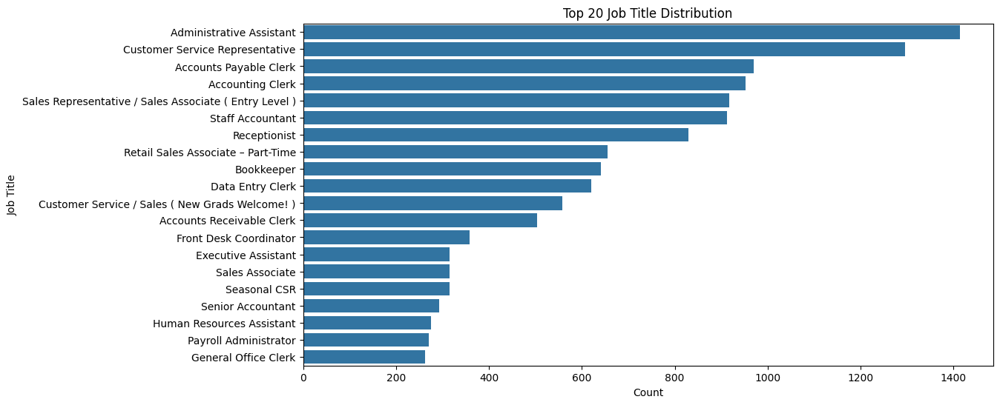

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the top 20 job titles by the number of occurrences
top_job_titles = df_jd['position'].value_counts().index[:20]

# Filter the DataFrame to include only these top job titles
df_top_job_titles = df_jd[df_jd['position'].isin(top_job_titles)]

# Plot the countplot for the top 20 job titles
plt.figure(figsize=(12, 6))
sns.countplot(y='position', data=df_top_job_titles, order=top_job_titles)
plt.title('Top 20 Job Title Distribution')
plt.xlabel('Count')
plt.ylabel('Job Title')
plt.show()



#### Insights

The top 20 job titles can reveal the most sought-after positions. High counts for specific titles like administrative assistans  indicate high demand in certain roles.

#### Top 10 Companies Distribution

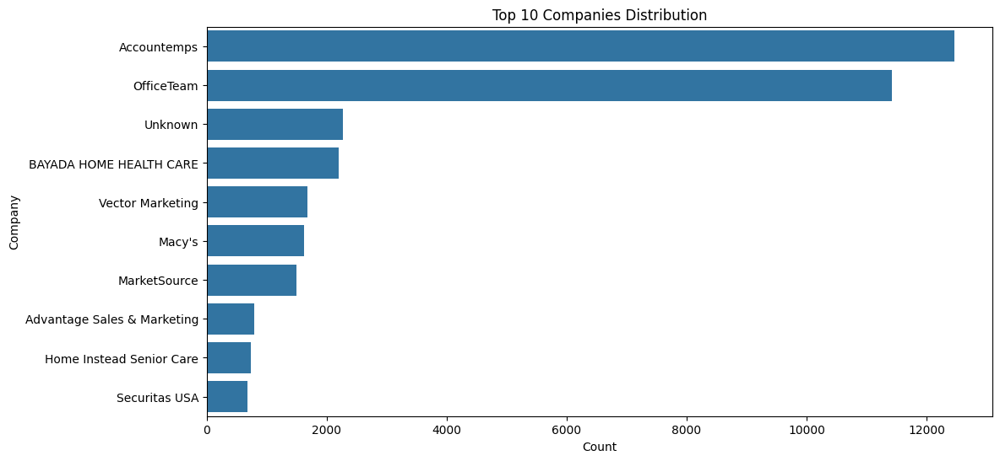

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the top 10 companies by the number of occurrences
top_companies = df_jd['company'].value_counts().index[:10]

# Filter the DataFrame to include only these top companies
df_top_companies = df_jd[df_jd['company'].isin(top_companies)]

# Plot the countplot for the top 10 companies
plt.figure(figsize=(12, 6))
sns.countplot(y='company', data=df_top_companies, order=top_companies)
plt.title('Top 10 Companies Distribution')
plt.xlabel('Count')
plt.ylabel('Company')
plt.show()


#### Insights

Identifying the top 10 companies by job postings helps to understand which companies are the most active in hiring, potentially indicating market leaders.

 #### Longitude and Latitide Distribution

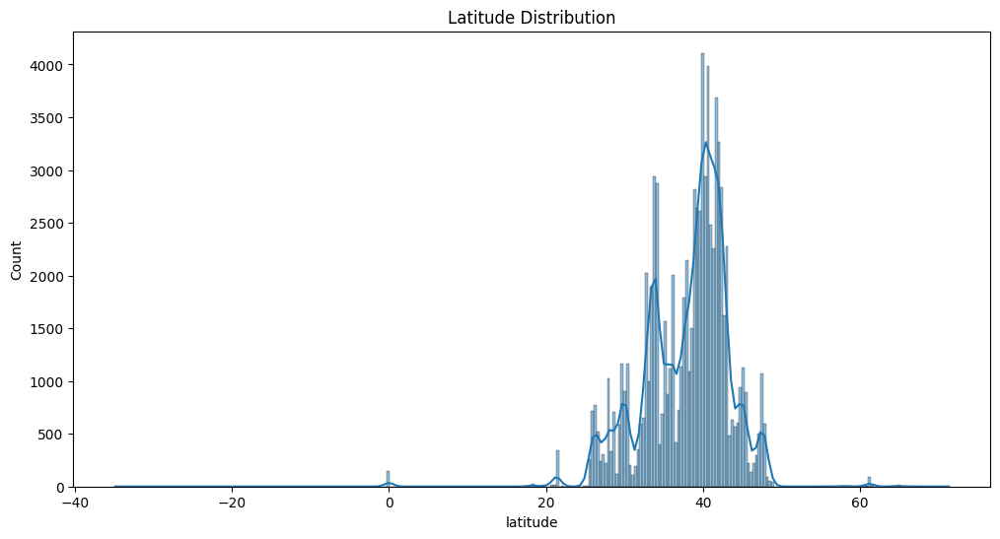

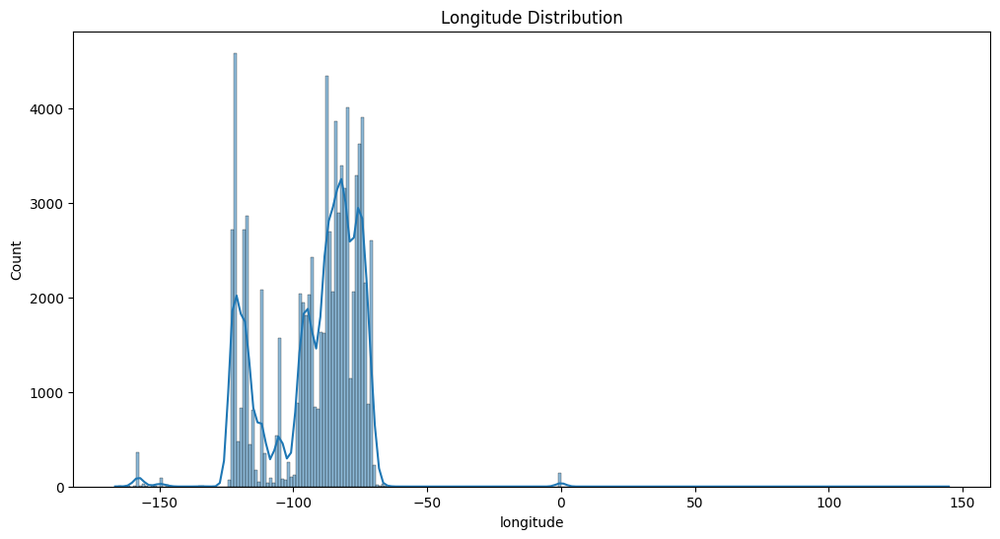

In [105]:
import matplotlib.pyplot as plt
import seaborn as sns
# Distribution of Latitude
plt.figure(figsize=(12, 6))
sns.histplot(df_jd['latitude'], kde=True)
plt.title('Latitude Distribution')
plt.show()

# Distribution of Longitude
plt.figure(figsize=(12, 6))
sns.histplot(df_jd['longitude'], kde=True)
plt.title('Longitude Distribution')
plt.show()


#### Insights

The histograms for latitude and longitude give insights into the geographical distribution of job listings. Peaks in these distributions can point to densely populated job areas.

#### Top 10 Positions Distribution

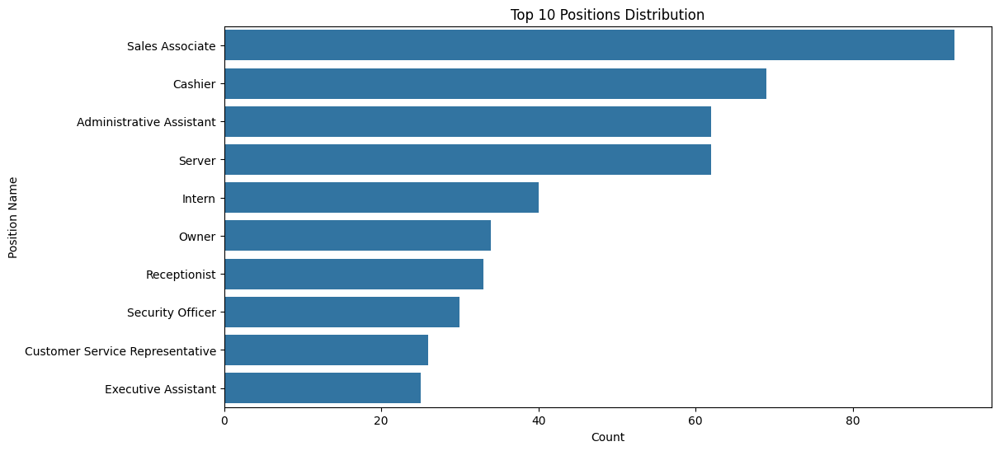

In [109]:
top_positions = df_cv['position.name'].value_counts().nlargest(10).index

plt.figure(figsize=(12, 6))
sns.countplot(y='position.name', data=df_cv, order=top_positions)
plt.title('Top 10 Positions Distribution')
plt.xlabel('Count')
plt.ylabel('Position Name')
plt.show()


#### Distribution Of Categorical Columns

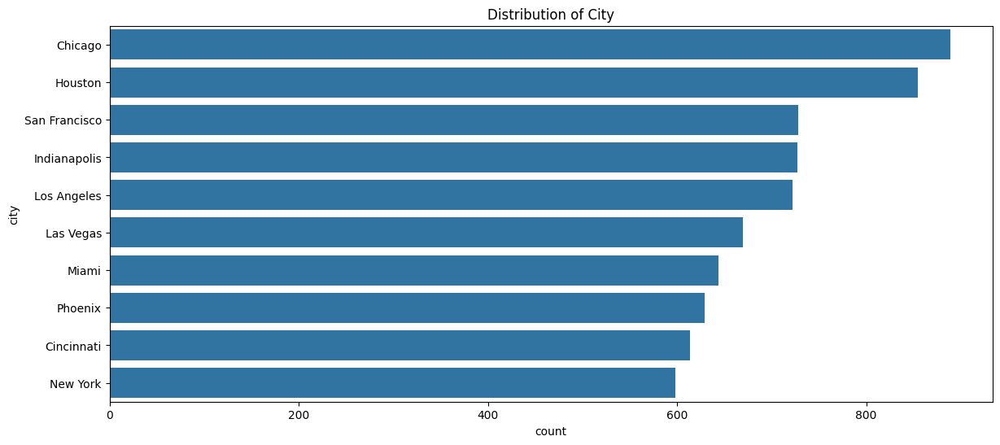

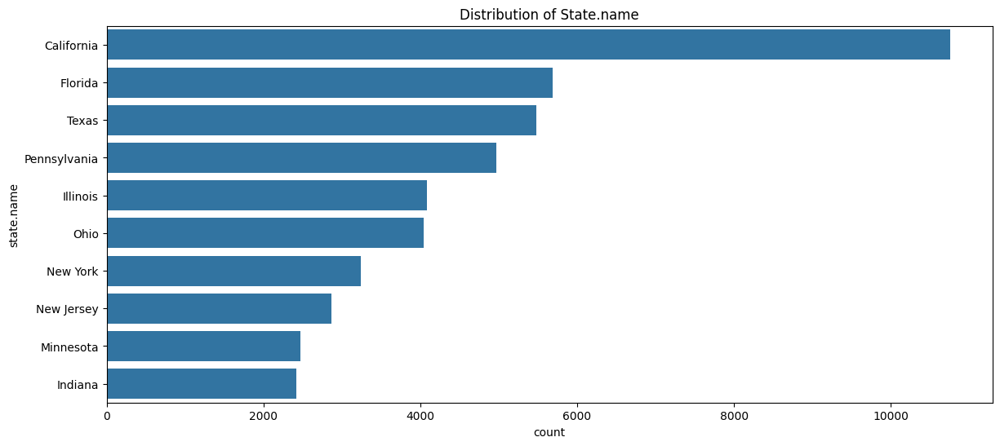

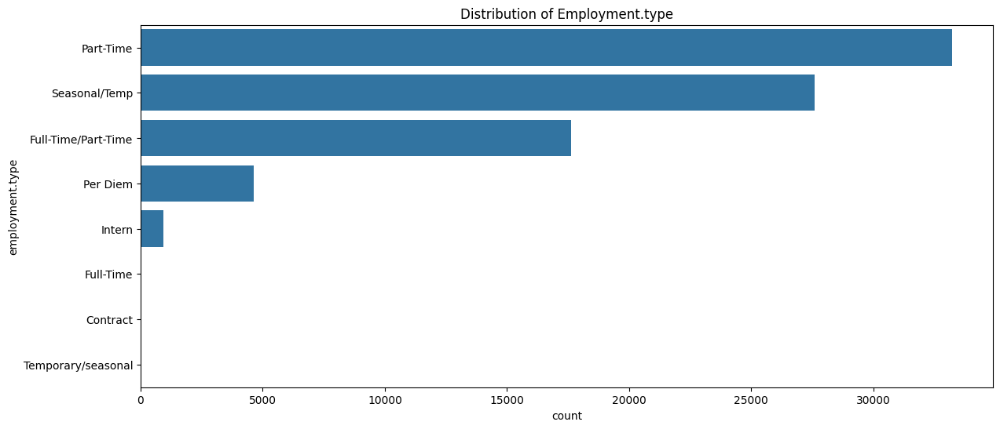

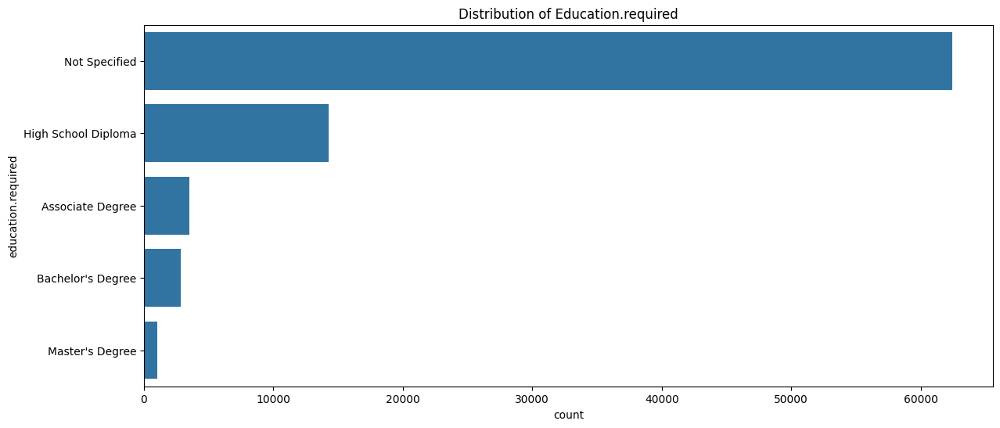

In [111]:
for col in ['city', 'state.name', 'employment.type', 'education.required']:
    plt.figure(figsize=(14, 6))
    sns.countplot(y=col, data=df_jd, order=df_jd[col].value_counts().index[:10])
    plt.title(f'Distribution of {col.capitalize()}')
    plt.show()

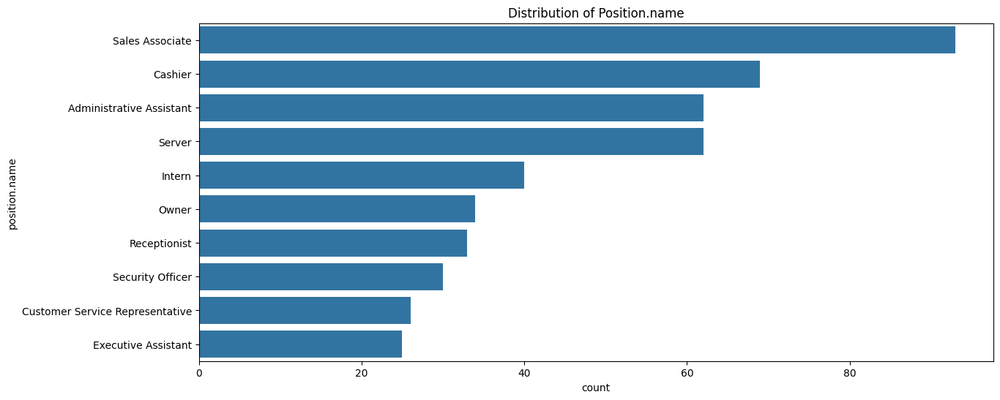

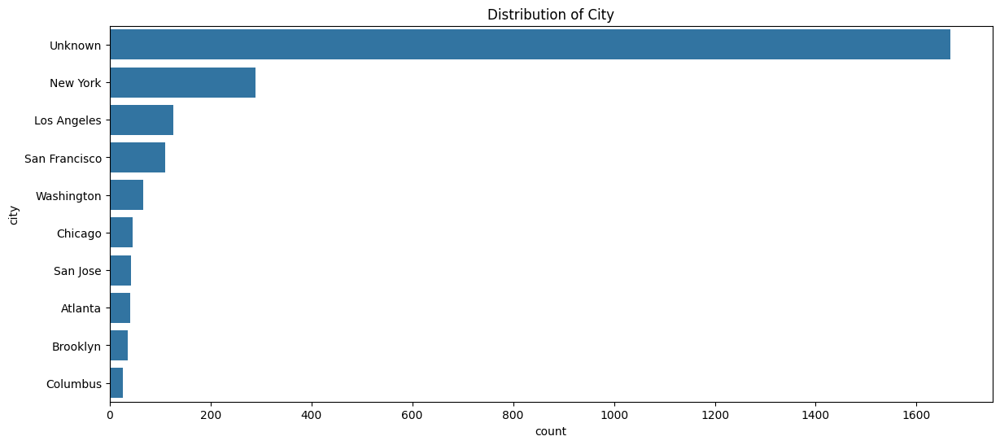

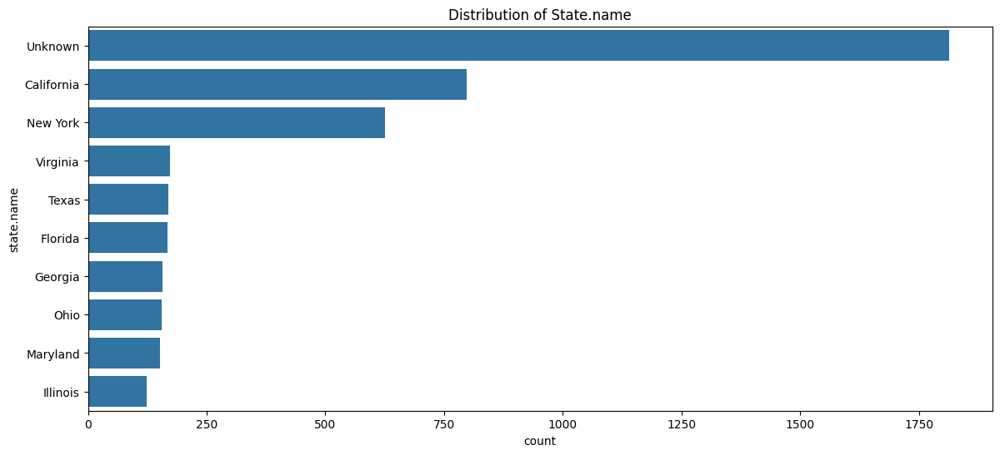

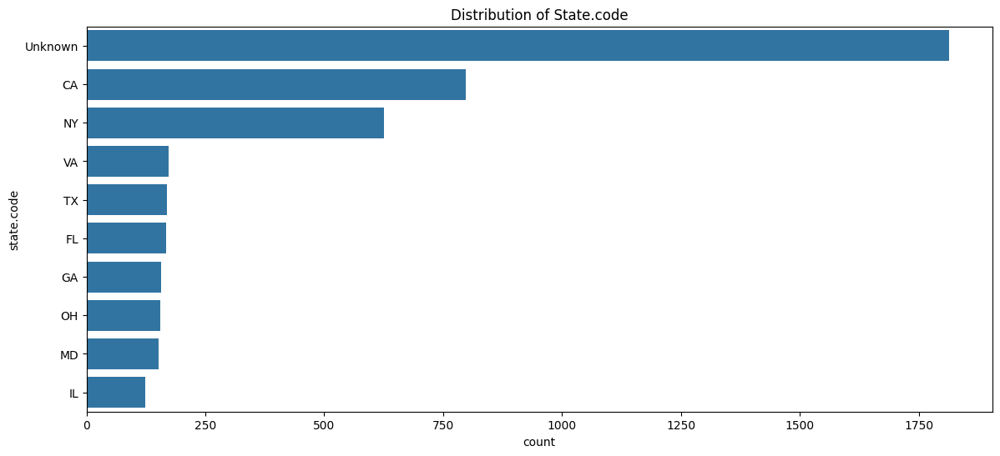

In [112]:
## Categorical Data - df_cv
for col in ['position.name', 'city', 'state.name', 'state.code']:
    plt.figure(figsize=(14, 6))
    sns.countplot(y=col, data=df_cv, order=df_cv[col].value_counts().index[:10])
    plt.title(f'Distribution of {col.capitalize()}')
    plt.show()

#### Insights

Distributions of categorical columns provide insights into the most common cities, states, employment types, and education levels required, which helps tailor job recommendations to user preference

#### Top 10 Companies by Job count

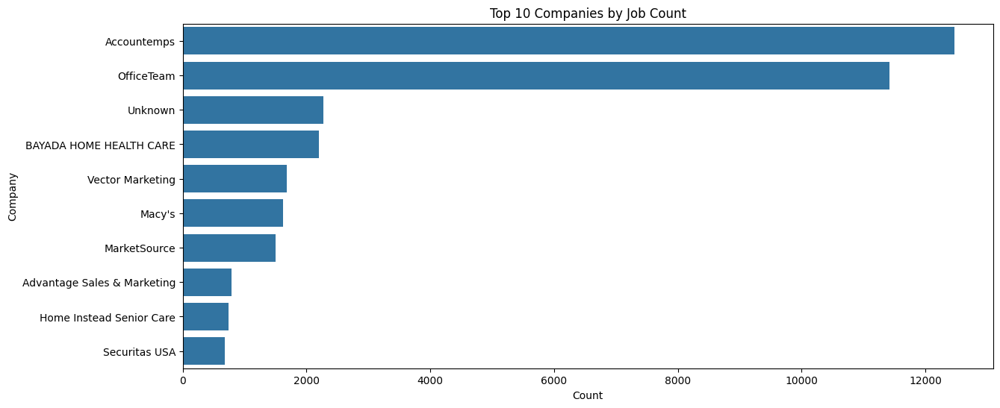

In [118]:
plt.figure(figsize=(14, 6))
top_companies = df_jd['company'].value_counts().nlargest(10).index  # Top 10 companies
sns.countplot(y='company', data=df_jd[df_jd['company'].isin(top_companies)], order=top_companies)
plt.title('Top 10 Companies by Job Count')
plt.xlabel('Count')
plt.ylabel('Company')
plt.show()

#### Insights

The bar chart reveals the top 10 companies that are actively hiring, showing which companies dominate the job market in the dataset.

The distribution provides an understanding of which companies are most likely to have job openings, which is crucial for job seekers targeting specific employers.


### 2.BIVARIATE ANALYSIS

#### Salary Distribution by Industry

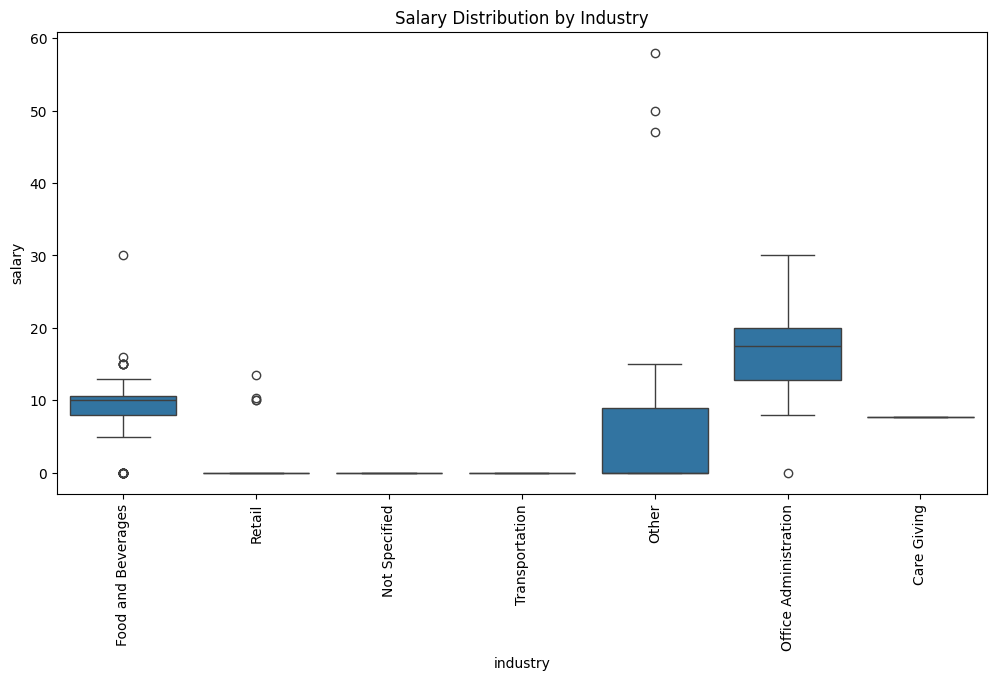

In [123]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='industry', y='salary', data=df_jd)
plt.title('Salary Distribution by Industry')
plt.xticks(rotation=90)
plt.show()


#### Insights

The boxplot demonstrates significant variations in salary across different industries.

Certain industries have a broader salary range, while others are more consistent, which can guide job seekers on which industries might offer higher compensation.

#### Salary vs Employment type

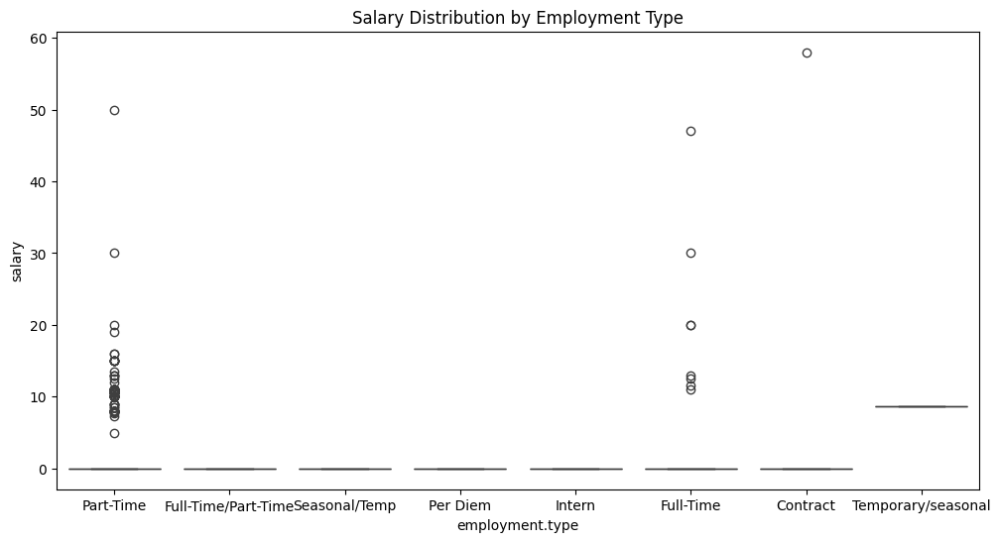

In [127]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='employment.type', y='salary', data=df_jd)
plt.title('Salary Distribution by Employment Type')
plt.show()


#### Insights
This plot highlights that full-time employment types generally offer higher salaries compared to part-time or contract positions.

The variation in salaries within employment types might be due to differences in job roles and industries.

#### Correlation Heatmap for numerical columns

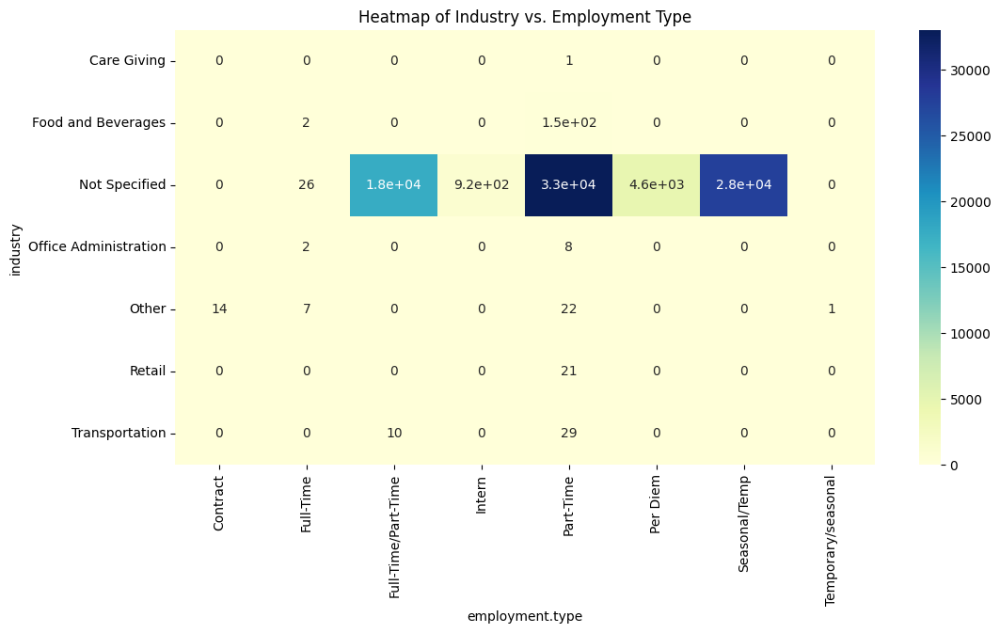

In [130]:
pivot_table = pd.crosstab(df_jd['industry'], df_jd['employment.type'])
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_table, annot=True, cmap='YlGnBu')
plt.title('Heatmap of Industry vs. Employment Type')
plt.show()


#### Insights:

The heatmap shows how certain industries favor specific employment types. For example, some industries may have more part-time roles, while others might offer more contract positions.

This can help job seekers understand industry trends in employment types, aiding in more targeted job applications.

#### Industry by Company

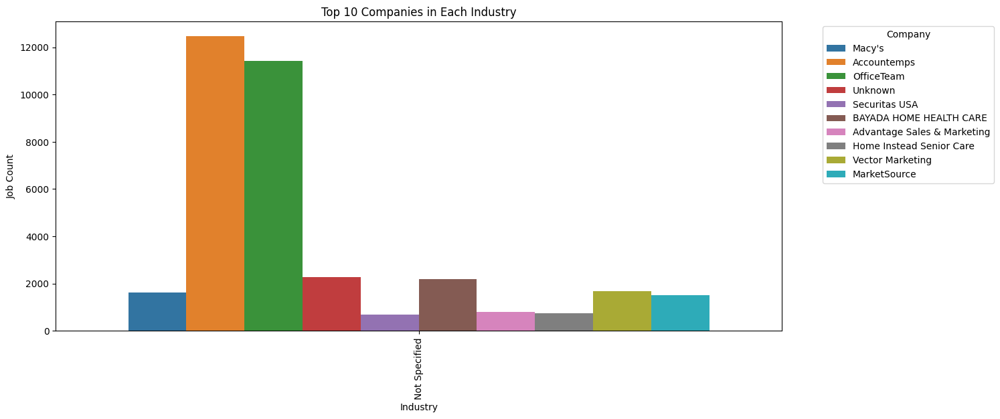

In [133]:
## Relationship between Industry and Company
plt.figure(figsize=(14, 6))
sns.countplot(x='industry', hue='company', data=df_jd[df_jd['company'].isin(top_companies)])
plt.title('Top 10 Companies in Each Industry')
plt.xticks(rotation=90)
plt.xlabel('Industry')
plt.ylabel('Job Count')
plt.legend(title='Company', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#### Insights:

This plot illustrates which companies are leading in specific industries, providing insights into the competitive landscape within sectors.

It can help job seekers identify the major players in their industry of interest and target these companies.

#### Positions by City

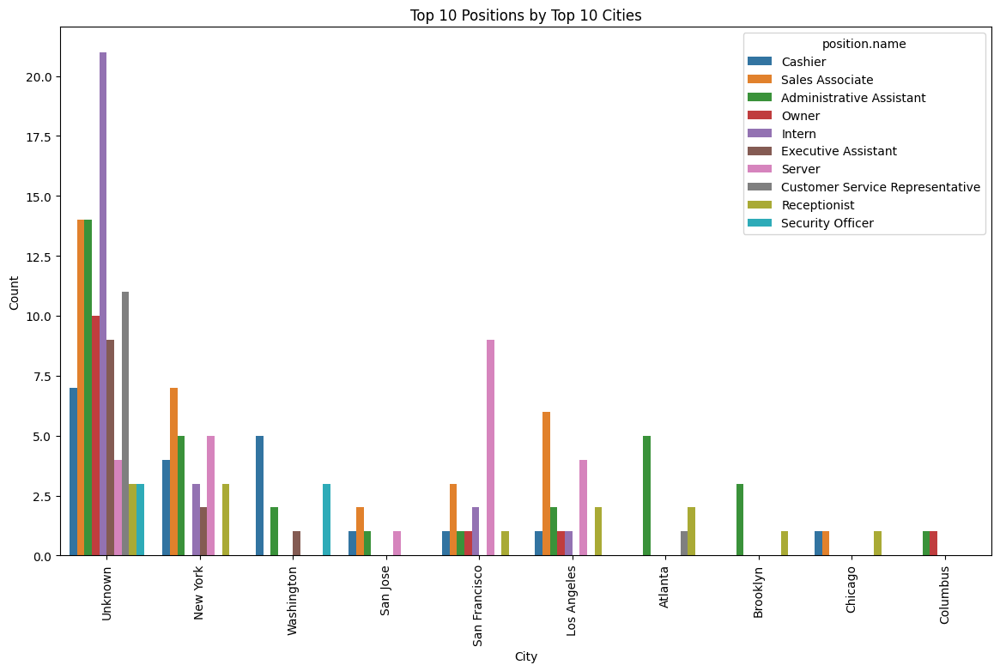

In [136]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the top 10 cities
top_cities = df_cv['city'].value_counts().nlargest(10).index

# Get the top 10 position names
top_positions = df_cv['position.name'].value_counts().nlargest(10).index

# Filter the DataFrame for the top cities and positions
df_cv_filtered = df_cv[df_cv['city'].isin(top_cities) & df_cv['position.name'].isin(top_positions)]

# Plot the countplot
plt.figure(figsize=(14, 8))
sns.countplot(x='city', hue='position.name', data=df_cv_filtered)
plt.title('Top 10 Positions by Top 10 Cities')
plt.xticks(rotation=90)
plt.xlabel('City')
plt.ylabel('Count')
plt.show()



#### Insights:

This visualization shows which positions are most common in the top 10 cities, revealing geographical preferences for certain job roles.
It can assist job seekers in identifying where their desired positions are most likely to be available.


### 3.MULTIVARIATE

#### Pairplot of Numerical Columns

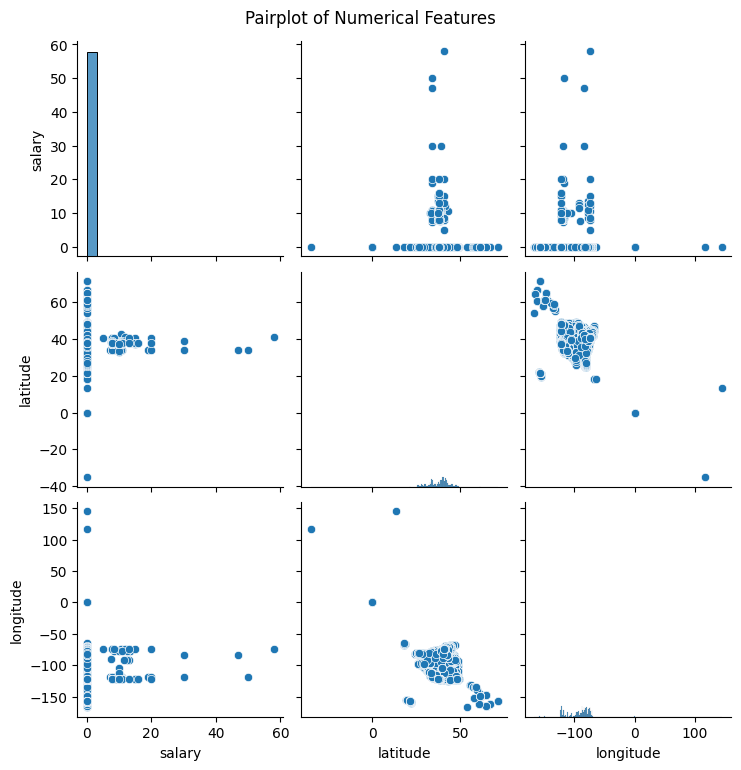

In [141]:
sns.pairplot(df_jd[['salary', 'latitude', 'longitude']])
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()


#### Insights:

The pairplot reveals relationships between numerical variables  salary, latitude, and longitude, indicating potential geographic salary trends.
Clustering patterns might suggest areas with higher or lower salary offerings, helping in location-based job searches.

#### Salary vs. Industry and Employment type

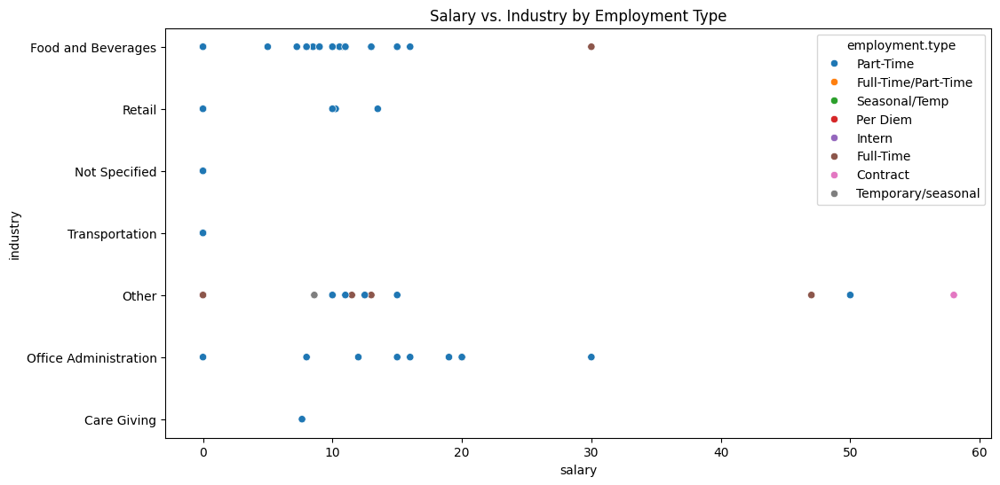

In [145]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='salary', y='industry', hue='employment.type', data=df_jd)
plt.title('Salary vs. Industry by Employment Type')
plt.show()


#### Insights:

The scatterplot shows the distribution of salaries across industries and employment types, allowing for a detailed comparison.

It highlights how certain employment types within industries may offer higher salaries, useful for negotiation and decision-making.

#### Geographical Distribution of Job Listings

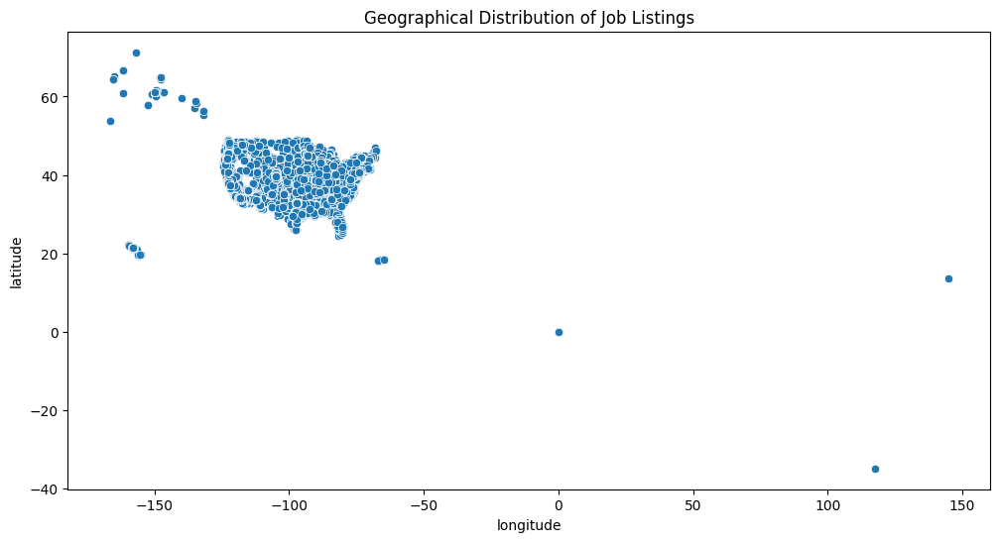

In [148]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x='longitude', y='latitude', data=df_jd)
plt.title('Geographical Distribution of Job Listings')
plt.show()

#### Insights

This scatterplot provides a geographical overview of job listings, identifying key regions with dense job availability.

It is beneficial for job seekers considering relocation, as it highlights areas with more job opportunities.

#### PCA for Numerical Columns

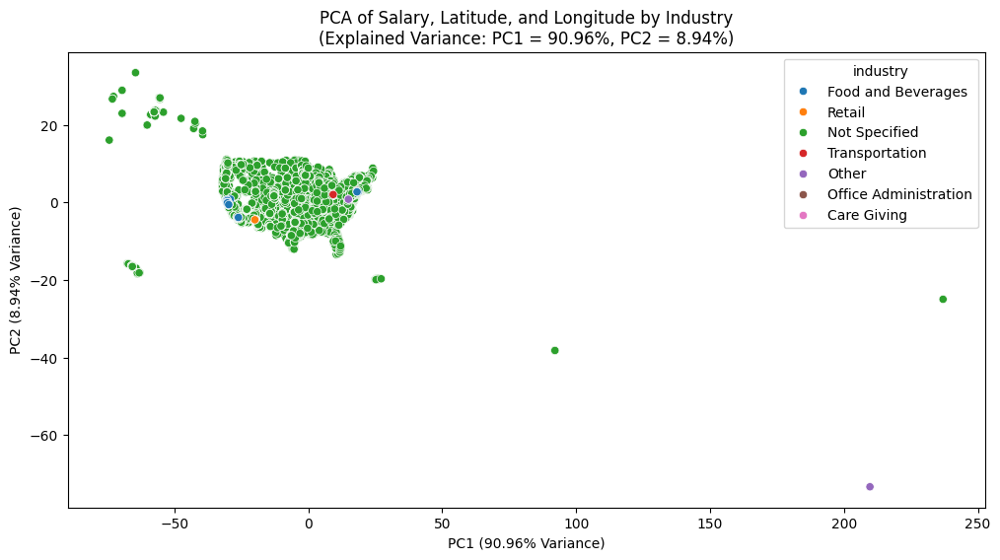

In [151]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Perform PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(df_jd[['salary', 'latitude', 'longitude']])

# Calculate the percentage of variance explained by each principal component
explained_variance = pca.explained_variance_ratio_ * 100

# Create a DataFrame for the PCA results
df_jd_pca = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Plot the PCA results
plt.figure(figsize=(12, 6))
sns.scatterplot(x='PC1', y='PC2', data=df_jd_pca, hue=df_jd['industry'])
plt.title(f'PCA of Salary, Latitude, and Longitude by Industry\n'
          f'(Explained Variance: PC1 = {explained_variance[0]:.2f}%, PC2 = {explained_variance[1]:.2f}%)')
plt.xlabel(f'PC1 ({explained_variance[0]:.2f}% Variance)')
plt.ylabel(f'PC2 ({explained_variance[1]:.2f}% Variance)')
plt.show()


#### Insights
Principal Component Analysis (PCA) Results:

1.PC1 (Principal Component 1): Explains 90.96% of the variance. This indicates that PC1 captures the most significant variance in the data, which is likely driven by one or a combination of the features (salary, latitude, longitude).

2.PC2 (Principal Component 2): Explains 8.945% of the variance. This component explains a much smaller proportion of the variance compared to PC1, suggesting that its contribution is less significant.

#### Interpretation:

1.PC1's Dominance: The fact that PC1 accounts for 90.96% of the variance implies that the majority of the variance in the dataset can be attributed to the primary component. This component likely represents the most dominant feature or a combination of features affecting job listings.

2.PC2's Minor Role: PC2's contribution is relatively minor, capturing only about 8.945% of the variance. It may represent less significant features or secondary patterns in the data.

#### Industry Visualization:

Industry Clusters: By plotting PC1 and PC2, we can observe how different industries are distributed across these principal components. Industries that are clustered together along PC1 suggest that their job listings share similar characteristics related to salary, latitude, and longitude.

#### Application:

Dimensionality Reduction: PCA is useful for reducing the dimensionality of the dataset while retaining most of the variance. This makes it easier to visualize and interpret complex datasets.

Feature Analysis: Understanding the features that contribute most to PC1 and PC2 can help in identifying key drivers in job listings and tailoring job recommendations or analyses accordingly.

#### LDA FOR NUMERICAL COLUMNS

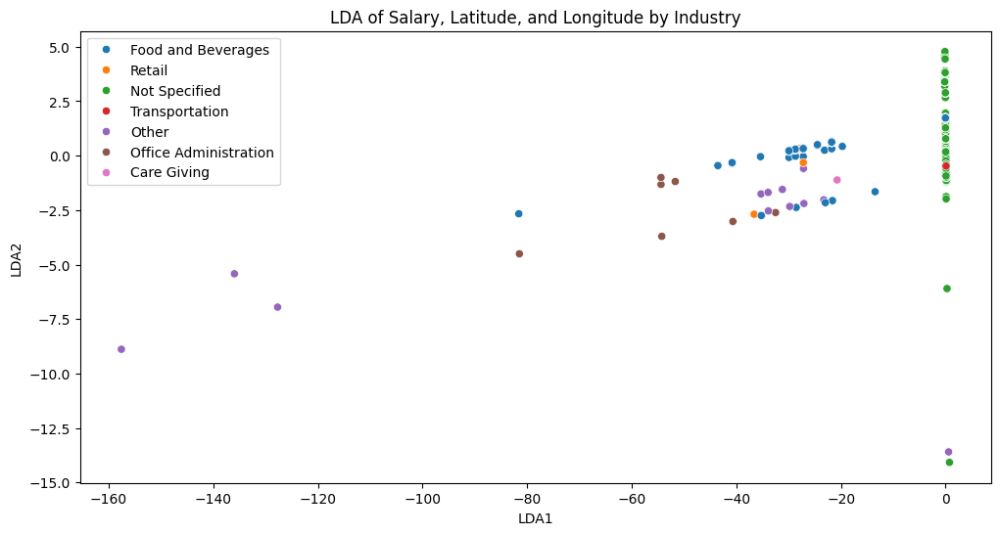

LDA Coefficients:
          salary  latitude  longitude
LDA1   56.527155  0.010183   0.003534
LDA2   64.348121 -0.025505  -0.090859
LDA3   -0.158066  0.000113   0.000203
LDA4  118.403816 -0.017885  -0.040009
LDA5   43.480817 -0.103462  -0.006474
LDA6   15.282083 -0.031761  -0.024223
LDA7   -0.154598 -0.005052  -0.051335


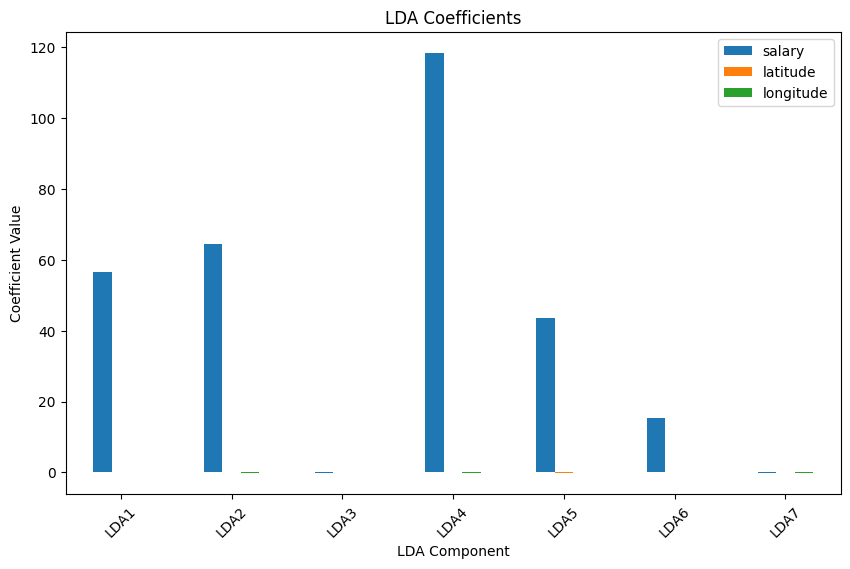

In [154]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Step 1: Ensure no missing values
if df_jd[['salary', 'latitude', 'longitude', 'industry']].isnull().any().any():
    df_jd = df_jd.dropna(subset=['salary', 'latitude', 'longitude', 'industry'])

# Step 2: Prepare the Data
X = df_jd[['salary', 'latitude', 'longitude']]
y = df_jd['industry']  # This should be categorical data

# Step 3: Fit LDA
lda = LDA(n_components=2)  # We want to reduce to 2 dimensions
X_lda = lda.fit_transform(X, y)

# Step 4: Create DataFrame for LDA results
df_jd_lda = pd.DataFrame(X_lda, columns=['LDA1', 'LDA2'])
df_jd_lda['industry'] = y.values

# Step 5: Plot LDA results
plt.figure(figsize=(12, 6))
sns.scatterplot(x='LDA1', y='LDA2', data=df_jd_lda, hue='industry', palette='tab10')
plt.title('LDA of Salary, Latitude, and Longitude by Industry')
plt.xlabel('LDA1')
plt.ylabel('LDA2')
plt.legend(loc='best')
plt.show()

# Step 6: Examine LDA coefficients
coefficients = lda.coef_
features = ['salary', 'latitude', 'longitude']
coef_df = pd.DataFrame(coefficients, columns=features, index=[f'LDA{i+1}' for i in range(coefficients.shape[0])])
print("LDA Coefficients:")
print(coef_df)

# Plotting LDA coefficients
coef_df.plot(kind='bar', figsize=(10, 6))
plt.title('LDA Coefficients')
plt.xlabel('LDA Component')
plt.ylabel('Coefficient Value')
plt.xticks(rotation=45)
plt.show()


#### Insights
1. Salary is a Major Driver:

 Salary has high coefficients in LDA1 and LDA2, indicating it plays a significant role in distinguishing between industries. This suggests salary differences are key in separating the industry categories in your dataset.

2. Geographic Factors (Latitude and Longitude) Have Minor Impact:

Latitude and longitude have relatively small coefficients in LDA1 and LDA2, showing they contribute less to distinguishing industries compared to salary.

3. LDA Components and Variance:

LDA1 and LDA2, with their high salary coefficients, capture the most meaningful variance related to industry classification. LDA3 to LDA7 have lower coefficients, indicating they contribute less to the separation between industries and may capture less relevant variance or noise.

4. Focus on Top Components:

The high coefficients in LDA1 and LDA2 suggest these components are the most informative for understanding how salary impacts industry classification. Simplifying your analysis to these components can provide clearer insights.

5. Visual Representation:

Visualizing the coefficients helps confirm the relative importance of each feature and component, making it easier to interpret the contributions and focus on the most significant factors.







#### PLOTLY

In [161]:
!pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 2.5 MB/s eta 0:00:0000:0100:01


In [163]:
import plotly.express as px

fig = px.scatter_mapbox(df_jd, lat="latitude", lon="longitude", color="industry", size="salary",
                        color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


#### Insights
1. Industry Distribution:

The map shows how various industries are geographically distributed, highlighting regions with high concentrations of specific industries.

2. Salary Trends:

Marker size represents salary levels, indicating areas with high or low salaries. This helps identify regions with higher-paying job opportunities.

3. Industry Clusters:

Clusters of markers suggest where particular industries are more prevalent, indicating job availability and regional industry concentration.

4. Regional Salary Insights:

Variations in marker size across regions reveal salary trends, highlighting areas with significant salary differences.

## STEP 3:Data Preprocessing

### Selecting columns

In [168]:
#Selecting columns for preprocessing and modelling
jd_fin = df_jd.loc[:, ['job.id', 'position', 'job.description']]

jd_fin = jd_fin.rename(columns={"job.id": "Job_ID",
                                  "position": "Job_position",
                                  "job.description": "Job_description"})

jd_fin = jd_fin.dropna(subset=["Job_description"])
jd_fin = jd_fin.drop_duplicates(subset=["Job_description"])

jd_fin.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59270 entries, 0 to 84089
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Job_ID           59270 non-null  int64 
 1   Job_position     59270 non-null  object
 2   Job_description  59270 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.8+ MB


In [169]:
#Selecting columns for preprocessing and modelling
cv_fin = df_cv.loc[:, ['applicant.id', 'position.name', 'job.description']] 
cv_fin = cv_fin.rename(columns={"applicant.id": "Applicant_ID",
                                  "position.name": "Current_position",
                                  "job.description": "Current_jd"})

cv_fin = cv_fin.drop_duplicates(subset=["Current_jd"])

cv_fin.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5490 entries, 3 to 8652
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Applicant_ID      5490 non-null   int64 
 1   Current_position  5490 non-null   object
 2   Current_jd        5490 non-null   object
dtypes: int64(1), object(2)
memory usage: 171.6+ KB


In [170]:
# Combining columns to create new column
jd_fin["Job_pos_and_desc"] = jd_fin["Job_position"].map(str) + "  " + jd_fin["Job_description"]
jd_fin.head()

,Job_ID,Job_position,Job_description,Job_pos_and_desc
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...


In [171]:
# Combining all JDs for each Applicant
cv_fin = cv_fin.groupby("Applicant_ID").agg({"Current_position": " ".join,"Current_jd": " ".join}).reset_index()
cv_fin.head()

,Applicant_ID,Current_position,Current_jd
0,2,Writer for the Uloop Blog Volunteer,"* Wrote articles for the ""Uloop Blog,"" which i..."
1,38,Sales Person & Phone Receptionist,Asking customer if they need any assistance an...
2,78,Impact team member,"Help maintain merchandise flow, Work on fillin..."
3,89,Healthcare Specialist / Combat Medic Clerk's h...,"Clinical and field medicine, Healthcare educat..."
4,96,Cashier Receptionist Cashiet/Waiter,Greeting people and introducing/recommend food...


In [172]:
#converting to lowercase and splitting into tokens at caps
def text_preprocessing(data):
   
    data["Job_pos_and_desc"] = data["Job_pos_and_desc"].apply(lambda x: re.sub( r"([A-Z][^a-z]*)", r" \1", x))
    data["Job_pos_and_desc"] = data["Job_pos_and_desc"].str.lower()
    
    return data

In [173]:
#tagging
def process_data(data):
    pos_noninformative = {".", "CC", "CD", "DT", "IN", "LS", "MD", "POS", "PRP",
                          "PRP$", "TO", "UH", "WDT", "WP", "WP$", "WRB"}

    # Tokenize, tag POS, and filter non-informative tokens
    data["POS"] = pos_tag_sents(map(word_tokenize, data["Job_pos_and_desc"].tolist()))
    data["POS_clean"] = data["POS"].apply(lambda x: [pair for pair in x if pair[0] != "nbsp" and pair[1] not in pos_noninformative])
    data["clean_token"] = data["POS_clean"].apply(lambda x: [word[0] for word in x])
    data["token_number"] = data["clean_token"].apply(len)
    
    return data  
# Processing the data
jd_fin = process_data(jd_fin)

jd_fin.head()

,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,"[(Server, RB), (Tacolicious, NNP), (', POS), (...","[(Server, RB), (Tacolicious, NNP), (first, JJ)...","[Server, Tacolicious, first, Palo, Alto, store...",36
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,"[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[Kitchen, Staff/Chef, New, French, Brasserie, ...",145
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,"[(Bartender, IN), (We, PRP), (are, VBP), (a, D...","[(are, VBP), (popular, JJ), (Mediterranean, NN...","[are, popular, Mediterranean, wine, bar, resta...",46
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,"[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[Server, ●, Serve, food/drinks, customers, pro...",27
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,"[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[Kitchen, Staff/Chef, Located, heart, Hollywoo...",33


In [174]:
# Filtering tokens based on their length
jd_fin["clean_token"] = jd_fin["clean_token"].apply(lambda x: [subelt for subelt in x if len(subelt) > 1])

# Updating the token_number column
def update_token_count(data):
    data["token_number"] = data["clean_token"].apply(len)
    return data

jd_fin = update_token_count(jd_fin)

jd_fin.head()

,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,"[(Server, RB), (Tacolicious, NNP), (', POS), (...","[(Server, RB), (Tacolicious, NNP), (first, JJ)...","[Server, Tacolicious, first, Palo, Alto, store...",30
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,"[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[Kitchen, Staff/Chef, New, French, Brasserie, ...",128
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,"[(Bartender, IN), (We, PRP), (are, VBP), (a, D...","[(are, VBP), (popular, JJ), (Mediterranean, NN...","[are, popular, Mediterranean, wine, bar, resta...",38
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,"[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[Server, Serve, food/drinks, customers, profes...",22
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,"[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[Kitchen, Staff/Chef, Located, heart, Hollywoo...",30


In [175]:
# Returning tokens into one single string for lemmatization
jd_fin["clean_jd"] = [" ".join(x) for x in jd_fin["clean_token"]]
jd_fin.head()

,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number,clean_jd
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,"[(Server, RB), (Tacolicious, NNP), (', POS), (...","[(Server, RB), (Tacolicious, NNP), (first, JJ)...","[Server, Tacolicious, first, Palo, Alto, store...",30,Server Tacolicious first Palo Alto store just ...
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,"[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[Kitchen, Staff/Chef, New, French, Brasserie, ...",128,Kitchen Staff/Chef New French Brasserie S.F Fi...
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,"[(Bartender, IN), (We, PRP), (are, VBP), (a, D...","[(are, VBP), (popular, JJ), (Mediterranean, NN...","[are, popular, Mediterranean, wine, bar, resta...",38,are popular Mediterranean wine bar restaurant ...
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,"[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[Server, Serve, food/drinks, customers, profes...",22,Server Serve food/drinks customers professiona...
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,"[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[Kitchen, Staff/Chef, Located, heart, Hollywoo...",30,Kitchen Staff/Chef Located heart Hollywood are...


In [176]:
wnl = WordNetLemmatizer()
patterns = "[^a-zA-Z \n\.]"

# Using stopwords list from nltk and adding extra stopwords
stopwords_eng = stopwords.words("english")
additional_stopwords = ["also", "new", "etc", "part", "time", "hours", "hour",
                        "week", "per", "please", "offer", "part time", "example",
                        "monday", "tuesday", "wednesday", "thursday", "friday",
                        "saturday", "sunday", "pm", "am"]
stopwords_eng.extend(additional_stopwords)

def lemmatize_sentence(text):
    text = re.sub(patterns, " ", text)
    tokens = [wnl.lemmatize(token.strip()) for token in text.split() if token and token not in stopwords_eng]
    return " ".join(tokens)

print("Before lemmatization:\n", jd_fin["clean_jd"].iloc[1])
print("\nAfter lemmatization:\n", lemmatize_sentence(jd_fin["clean_jd"].iloc[1]))


Before lemmatization:
 Kitchen Staff/Chef New French Brasserie S.F Financial District Seeks Chef are seeking energetic dynamic chef take charge grow company ideal candidate is motivated self-starter has great work ethic is ready challenge building own team executive support position is perfect fit talented chef ready take next step someone multi task high volume kitchen has exceptional organizational skills Position requirements are experience French cuisine minimum years sous chef high volume full service restaurant be team player leading example working side side other members team Computer management skills are are experience ordering inventory cost control right candidate have previously demonstrated understanding leadership accountability infectious energetic approach problem solving facing challenges are equal opportunity employer Qualified applicants are considered employment regard age race religion sex national origin sexual orientation disability veteran status

After lemmati

In [177]:
# Getting new column with lemmatize text
jd_fin["jd_lem"] = jd_fin["clean_jd"].apply(lemmatize_sentence)
jd_fin.head()

,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number,clean_jd,jd_lem
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,"[(Server, RB), (Tacolicious, NNP), (', POS), (...","[(Server, RB), (Tacolicious, NNP), (first, JJ)...","[Server, Tacolicious, first, Palo, Alto, store...",30,Server Tacolicious first Palo Alto store just ...,Server Tacolicious first Palo Alto store opene...
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,"[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[Kitchen, Staff/Chef, New, French, Brasserie, ...",128,Kitchen Staff/Chef New French Brasserie S.F Fi...,Kitchen Staff Chef New French Brasserie S.F Fi...
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,"[(Bartender, IN), (We, PRP), (are, VBP), (a, D...","[(are, VBP), (popular, JJ), (Mediterranean, NN...","[are, popular, Mediterranean, wine, bar, resta...",38,are popular Mediterranean wine bar restaurant ...,popular Mediterranean wine bar restaurant Fina...
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,"[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[Server, Serve, food/drinks, customers, profes...",22,Server Serve food/drinks customers professiona...,Server Serve food drink customer professional ...
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,"[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[Kitchen, Staff/Chef, Located, heart, Hollywoo...",30,Kitchen Staff/Chef Located heart Hollywood are...,Kitchen Staff Chef Located heart Hollywood pop...


In [178]:
# Updating token_num_aft_lem column
jd_fin["token_num_aft_lem"] = [len(word.split()) for word in jd_fin["jd_lem"]]
jd_fin.head()

,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number,clean_jd,jd_lem,token_num_aft_lem
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,"[(Server, RB), (Tacolicious, NNP), (', POS), (...","[(Server, RB), (Tacolicious, NNP), (first, JJ)...","[Server, Tacolicious, first, Palo, Alto, store...",30,Server Tacolicious first Palo Alto store just ...,Server Tacolicious first Palo Alto store opene...,28
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,"[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[Kitchen, Staff/Chef, New, French, Brasserie, ...",128,Kitchen Staff/Chef New French Brasserie S.F Fi...,Kitchen Staff Chef New French Brasserie S.F Fi...,114
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,"[(Bartender, IN), (We, PRP), (are, VBP), (a, D...","[(are, VBP), (popular, JJ), (Mediterranean, NN...","[are, popular, Mediterranean, wine, bar, resta...",38,are popular Mediterranean wine bar restaurant ...,popular Mediterranean wine bar restaurant Fina...,33
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,"[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[Server, Serve, food/drinks, customers, profes...",22,Server Serve food/drinks customers professiona...,Server Serve food drink customer professional ...,20
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,"[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[Kitchen, Staff/Chef, Located, heart, Hollywoo...",30,Kitchen Staff/Chef Located heart Hollywood are...,Kitchen Staff Chef Located heart Hollywood pop...,26


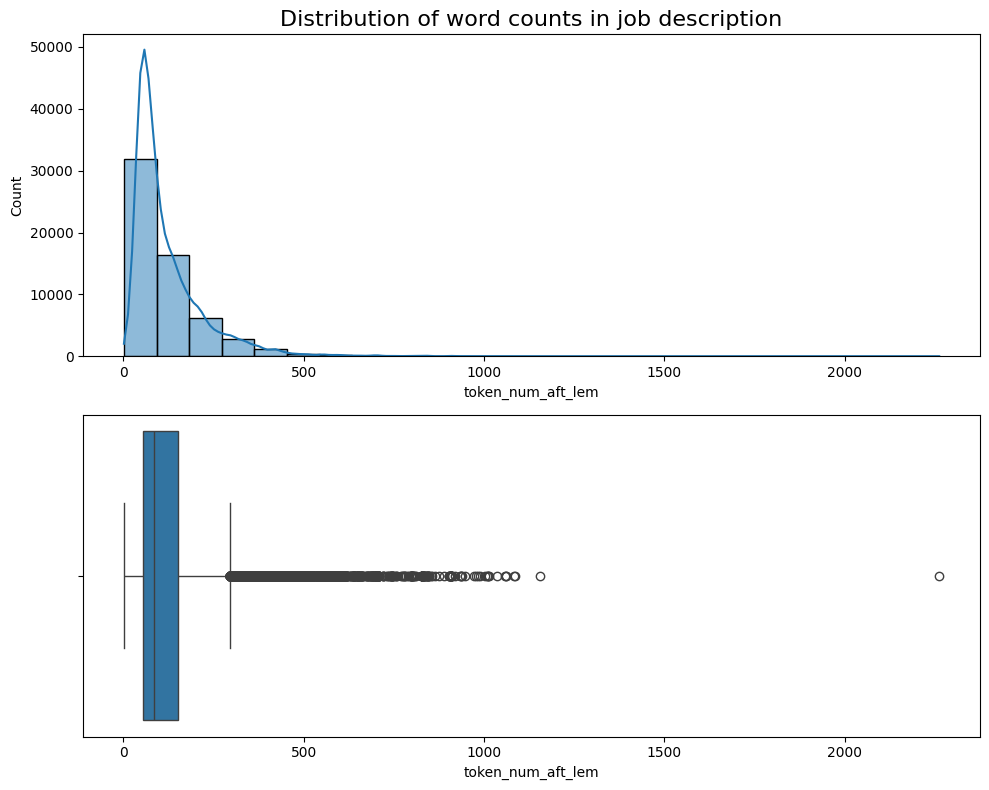

In [179]:
# Data visualization: histogram and boxplot
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# Histogram with KDE
sns.histplot(
    data=jd_fin,
    x="token_num_aft_lem",
    bins=25,
    kde=True,
    ax=axes[0]
).set_title("Distribution of word counts in job description", fontsize=16)

# Boxplot
sns.boxplot(
    data=jd_fin,
    x="token_num_aft_lem",
    orient="h",
    width=0.9,
    ax=axes[1]
)

# Adjust layout
plt.tight_layout()


In [180]:
# Number of Job Descriptions with less than 10 words
display(jd_fin[jd_fin["token_num_aft_lem"] <= 10]["Job_position"].count())

165

In [181]:
# Number of Job Descriptions with more than 290 words
display(len(jd_fin[jd_fin["token_num_aft_lem"] > 290]["Job_ID"]))

4071

In [182]:
# Removal of outliers (JDs with <= 10 or >290 words)
jd_fin = jd_fin[(jd_fin["token_num_aft_lem"] <= 290)&(jd_fin["token_num_aft_lem"] > 10)]
jd_fin.shape[0]

55034

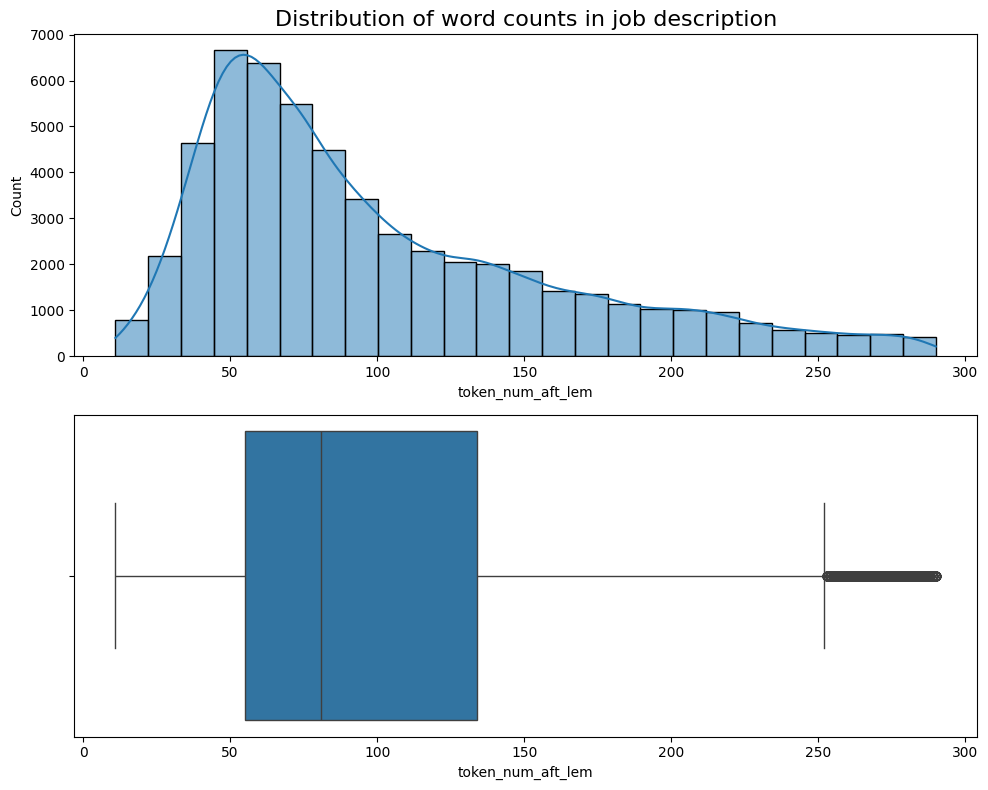

In [183]:
# Data visualization: histogram and boxplot
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# Histogram with KDE
sns.histplot(
    data=jd_fin,
    x="token_num_aft_lem",
    bins=25,
    kde=True,
    ax=axes[0]
).set_title("Distribution of word counts in job description", fontsize=16)

# Boxplot
sns.boxplot(
    data=jd_fin,
    x="token_num_aft_lem",
    orient="h",
    width=0.9,
    ax=axes[1]
)

# Adjust layout
plt.tight_layout()

In [184]:
jd_mod = jd_fin.reset_index(drop=True)
display(jd_mod.head())
display(jd_mod.iloc[-2:])
jd_mod.shape

,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number,clean_jd,jd_lem,token_num_aft_lem
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,"[(Server, RB), (Tacolicious, NNP), (', POS), (...","[(Server, RB), (Tacolicious, NNP), (first, JJ)...","[Server, Tacolicious, first, Palo, Alto, store...",30,Server Tacolicious first Palo Alto store just ...,Server Tacolicious first Palo Alto store opene...,28
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,"[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[(Kitchen, NNP), (Staff/Chef, NNP), (New, NNP)...","[Kitchen, Staff/Chef, New, French, Brasserie, ...",128,Kitchen Staff/Chef New French Brasserie S.F Fi...,Kitchen Staff Chef New French Brasserie S.F Fi...,114
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,"[(Bartender, IN), (We, PRP), (are, VBP), (a, D...","[(are, VBP), (popular, JJ), (Mediterranean, NN...","[are, popular, Mediterranean, wine, bar, resta...",38,are popular Mediterranean wine bar restaurant ...,popular Mediterranean wine bar restaurant Fina...,33
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,"[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[(Server, NNP), (●, NNP), (Serve, NNP), (food/...","[Server, Serve, food/drinks, customers, profes...",22,Server Serve food/drinks customers professiona...,Server Serve food drink customer professional ...,20
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,"[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[(Kitchen, NNP), (Staff/Chef, NNP), (Located, ...","[Kitchen, Staff/Chef, Located, heart, Hollywoo...",30,Kitchen Staff/Chef Located heart Hollywood are...,Kitchen Staff Chef Located heart Hollywood pop...,26


,Job_ID,Job_position,Job_description,Job_pos_and_desc,POS,POS_clean,clean_token,token_number,clean_jd,jd_lem,token_num_aft_lem
55032,84,Driver,ONIGILLY (Japanese rice ball wraps) seeks outg...,Driver ONIGILLY (Japanese rice ball wraps) se...,"[(Driver, NNP), (ONIGILLY, NNP), ((, (), (Japa...","[(Driver, NNP), (ONIGILLY, NNP), ((, (), (Japa...","[Driver, ONIGILLY, Japanese, rice, ball, wraps...",121,Driver ONIGILLY Japanese rice ball wraps seeks...,Driver ONIGILLY Japanese rice ball wrap seek o...,111
55033,88,Line Cook,We are a popular Mediterranean restaurant in F...,Line Cook We are a popular Mediterranean rest...,"[(Line, JJ), (Cook, NNP), (We, PRP), (are, VBP...","[(Line, JJ), (Cook, NNP), (are, VBP), (popular...","[Line, Cook, are, popular, Mediterranean, rest...",40,Line Cook are popular Mediterranean restaurant...,Line Cook popular Mediterranean restaurant Fin...,37


(55034, 11)

In [185]:
jd_mod = jd_mod[["Job_ID", "Job_position", "Job_description", "Job_pos_and_desc", "jd_lem"]].iloc[:]
display(jd_mod.head())
jd_mod.shape

,Job_ID,Job_position,Job_description,Job_pos_and_desc,jd_lem
0,111,Server,Tacolicious' first Palo Alto store just opened...,Server Tacolicious' first Palo Alto store jus...,Server Tacolicious first Palo Alto store opene...
1,113,Kitchen Staff/Chef,\r\n\r\nNew French Brasserie in S.F. Financia...,Kitchen Staff/Chef \r\n\r\nNew French Brasse...,Kitchen Staff Chef New French Brasserie S.F Fi...
2,117,Bartender,We are a popular Mediterranean wine bar and re...,Bartender We are a popular Mediterranean wine...,popular Mediterranean wine bar restaurant Fina...
3,121,Server,● Serve food/drinks to customers in a profess...,Server ● Serve food/drinks to customers in a...,Server Serve food drink customer professional ...
4,127,Kitchen Staff/Chef,"Located at the heart of Hollywood, we are one ...",Kitchen Staff/Chef Located at the heart of Ho...,Kitchen Staff Chef Located heart Hollywood pop...


(55034, 5)

## Step 4: Modelling

In [187]:
# Generating Tfidf matrix
tfidf_vect = TfidfVectorizer(min_df=5,
                             max_df=0.95
                            )

tfidf = tfidf_vect.fit(jd_mod["jd_lem"]) #fitting the vector
tfidf

TfidfVectorizer(max_df=0.95, min_df=5)

In [188]:
# Vectorize applicants' job experience
cv_tfidf = tfidf_vect.transform(cv_fin["Current_jd"])
cv_tfidf

<2313x16171 sparse matrix of type '<class 'numpy.float64'>'
	with 119232 stored elements in Compressed Sparse Row format>

In [189]:
def Applicant_Job (job_id):
    # Check if the job ID exists in the job descriptions DataFrame
    if job_id in jd_mod["Job_ID"].tolist():
        index = np.where(jd_mod["Job_ID"] == job_id)[0]
        jd_q = jd_mod.iloc[index[0]:(index[-1] + 1)]

        print(f"Information about Vacancy: {job_id}")
        display(jd_q)

        # Vectorize vacancy's job description
        jd_tfidf = tfidf_vect.transform(jd_q["Job_description"])

        # Compute similarity score
        similarity_score = [linear_kernel(jd_tfidf, cv_tfidf[i])[0][0] for i in range(cv_tfidf.shape[0])]
        
        # Get the top 10 recommendations
        top_indices = sorted(range(len(similarity_score)), key=lambda i: similarity_score[i], reverse=True)[:10]
        recommendation = pd.DataFrame({
            "Job_ID": [job_id] * 10,
            "Recommended_Applicant_ID": [cv_fin["Applicant_ID"].iloc[i] for i in top_indices]
        })
        
        # Getting the job IDs and their data
        nearest_candidates = recommendation["Recommended_Applicant_ID"]
        applicant_recommended = pd.DataFrame(columns=["Job_ID", "Job_position", "Recommended_Applicant_ID", "Work_experience", "Previous_job"])
        
        for count, applicant_id in enumerate(nearest_candidates):
            index_resume = cv_fin.index[cv_fin["Applicant_ID"] == applicant_id][0]
            job_position = jd_mod[jd_mod["Job_ID"] == job_id]["Job_position"].iloc[0]
            work_experience = cv_fin["Current_jd"].iloc[index_resume]
            previous_job = cv_fin["Current_position"].iloc[index_resume]
            
            applicant_recommended.loc[count] = [job_id, job_position, applicant_id, work_experience, previous_job]
        
        print(f"\nRecommended Applicant IDs for Vacancy {job_id}\n")
        display(applicant_recommended)
        
        return applicant_recommended
    else:
        return "This Job_ID is not in the Jobs' list"


In [190]:
Applicant_Job (129)

Information about Vacancy: 129


,Job_ID,Job_position,Job_description,Job_pos_and_desc,jd_lem
5,129,Receptionist,We are a group of professional massage therapi...,Receptionist We are a group of professional m...,Receptionist group professional massage therap...



Recommended Applicant IDs for Vacancy 129



,Job_ID,Job_position,Recommended_Applicant_ID,Work_experience,Previous_job
0,129,Receptionist,11509,"Iintership Event Coordinator, contributing to ...",ATHGO forum 2011 Finance Controller Independen...
1,129,Receptionist,2850,We believe in the pursuers of dreams. Those pe...,Founder
2,129,Receptionist,7370,Support Specialist assisting teachers at Curri...,Coordinator (contracted position) Curriculum T...
3,129,Receptionist,14354,Stage Manager For the Production Company Perso...,Stage Manager Personal Assistant to Selena Soo...
4,129,Receptionist,539,Ensure that each person gets the best customer...,Lead Server
5,129,Receptionist,4558,People are rude,Waiter
6,129,Receptionist,2214,ProfyleTracker was founded and developed throu...,Business Development Manager Senior Recruitmen...
7,129,Receptionist,11156,Supported the Medicare area by bringing my pas...,Contractor/Consultant - Part Time Vice Preside...
8,129,Receptionist,4372,At Gold Core International we challenge the st...,Owner Business Development Consultant Sales & ...
9,129,Receptionist,9152,Teaching in this school requires a firm unders...,HS Teacher Coordinator/Principal Assistant Pri...


,Job_ID,Job_position,Recommended_Applicant_ID,Work_experience,Previous_job
0,129,Receptionist,11509,"Iintership Event Coordinator, contributing to ...",ATHGO forum 2011 Finance Controller Independen...
1,129,Receptionist,2850,We believe in the pursuers of dreams. Those pe...,Founder
2,129,Receptionist,7370,Support Specialist assisting teachers at Curri...,Coordinator (contracted position) Curriculum T...
3,129,Receptionist,14354,Stage Manager For the Production Company Perso...,Stage Manager Personal Assistant to Selena Soo...
4,129,Receptionist,539,Ensure that each person gets the best customer...,Lead Server
5,129,Receptionist,4558,People are rude,Waiter
6,129,Receptionist,2214,ProfyleTracker was founded and developed throu...,Business Development Manager Senior Recruitmen...
7,129,Receptionist,11156,Supported the Medicare area by bringing my pas...,Contractor/Consultant - Part Time Vice Preside...
8,129,Receptionist,4372,At Gold Core International we challenge the st...,Owner Business Development Consultant Sales & ...
9,129,Receptionist,9152,Teaching in this school requires a firm unders...,HS Teacher Coordinator/Principal Assistant Pri...


In [191]:
def Job_Applicant(applicant_id):
    if applicant_id not in cv_fin["Applicant_ID"].tolist():
        return "This Applicant_ID is not in Applicants' list"
    
    index = np.where(cv_fin["Applicant_ID"] == applicant_id)[0]
    cv_q = cv_fin.iloc[index[0]:(index[-1] + 1)]  # Handle multiple rows with same applicant ID

    print(f"Information about Applicant: {applicant_id}")
    display(cv_q)

    # Vectorize applicant job experience and job descriptions
    cv_tfidf = tfidf_vect.transform(cv_q["Current_jd"])
    jd_tfidf = tfidf_vect.transform(jd_mod["Job_description"])

    # Compute similarity scores
    similarity_scores = [linear_kernel(cv_tfidf, jd_tfidf[i])[0][0] for i in range(jd_tfidf.shape[0])]

    if len(cv_q) > 1:
        print("\nThis Applicant has more than 1 resume (different job description)\n")
    else:
        print("\nThis Applicant has only 1 resume\n")
    
    # Get the top 10 recommendations
    top_indices = sorted(range(len(similarity_scores)), key=lambda i: similarity_scores[i], reverse=True)[:10]
    recommendation = pd.DataFrame({
        "Applicant_ID": [applicant_id] * 10,
        "Recommended_Job_ID": [jd_mod["Job_ID"].iloc[i] for i in top_indices]
    })

    # Create DataFrame to hold recommended job information
    job_recommended = pd.DataFrame(columns=["Applicant_ID", "Applicant_job_title", "Recommended_Job_ID", "Job_description", "Job_title"])

    for count, job_id in enumerate(recommendation["Recommended_Job_ID"]):
        index_vacancy = jd_mod.index[jd_mod["Job_ID"] == job_id][0]
        applicant_job_title = cv_fin["Current_position"].iloc[index[0]:(index[-1] + 1)].tolist()
        job_description = jd_mod["Job_description"].iloc[index_vacancy]
        job_title = jd_mod["Job_position"].iloc[index_vacancy]
        
        job_recommended.loc[count] = [applicant_id, applicant_job_title, job_id, job_description, job_title]
    
    display(job_recommended.head())

    return job_recommended


In [192]:
Job_Applicant(14092)

Information about Applicant: 14092


,Applicant_ID,Current_position,Current_jd
2174,14092,Customer Service Representative Assistant Mana...,Take calls from customers seeking health insur...



This Applicant has only 1 resume



,Applicant_ID,Applicant_job_title,Recommended_Job_ID,Job_description,Job_title
0,14092,[Customer Service Representative Assistant Man...,318502,Exciting Opportunities with A Growing Organiza...,Retail Sales Associates (Part-time)
1,14092,[Customer Service Representative Assistant Man...,301864,Exciting Opportunities with A Growing Organiza...,Retail Sales Associates (Part-time)
2,14092,[Customer Service Representative Assistant Man...,278043,Exciting Opportunities with A Growing Organiza...,Retail Sales Associates (Part-time)
3,14092,[Customer Service Representative Assistant Man...,282884,Ref ID: 00701-106692Classification: Customer S...,Customer Service Representative
4,14092,[Customer Service Representative Assistant Man...,271453,Exciting Opportunities With A Growing Organiza...,Retail Sales Associates (F/T and P/T)


,Applicant_ID,Applicant_job_title,Recommended_Job_ID,Job_description,Job_title
0,14092,[Customer Service Representative Assistant Man...,318502,Exciting Opportunities with A Growing Organiza...,Retail Sales Associates (Part-time)
1,14092,[Customer Service Representative Assistant Man...,301864,Exciting Opportunities with A Growing Organiza...,Retail Sales Associates (Part-time)
2,14092,[Customer Service Representative Assistant Man...,278043,Exciting Opportunities with A Growing Organiza...,Retail Sales Associates (Part-time)
3,14092,[Customer Service Representative Assistant Man...,282884,Ref ID: 00701-106692Classification: Customer S...,Customer Service Representative
4,14092,[Customer Service Representative Assistant Man...,271453,Exciting Opportunities With A Growing Organiza...,Retail Sales Associates (F/T and P/T)
5,14092,[Customer Service Representative Assistant Man...,271526,Exciting Opportunities With A Growing Organiza...,Retail Sales Associates (F/T and P/T)
6,14092,[Customer Service Representative Assistant Man...,250902,Ref ID: 00701-106631Classification: Receptioni...,Front Desk Coordinator
7,14092,[Customer Service Representative Assistant Man...,254694,Ref ID: 00701-106639Classification: Receptioni...,Front Desk Coordinator
8,14092,[Customer Service Representative Assistant Man...,271557,Exciting Opportunities With A Growing Organiza...,Retail Sales Associates (F/T and P/T)
9,14092,[Customer Service Representative Assistant Man...,271443,Exciting Opportunities With A Growing Organiza...,Retail Sales Associates (F/T and P/T)
